In [44]:
# reload magics
%load_ext autoreload
%autoreload 2

## IMPORTS

In [1]:
from copy import deepcopy, copy
from hdbscan import all_points_membership_vectors, HDBSCAN
# from matplotlib.axes import Axes
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
# from typing import Dict, List, Tuple, Optional
from umap import UMAP
# from upsetplot import from_memberships, plot, UpSet, from_indicators, from_contents
import colorcet as cc
import matplotlib.colors as mc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.colors as mcolors

# instantiate the Boruta feature selector
from boruta_py.boruta import BorutaPy

from project_modules.clustering import make_feature_importance_df, make_topN_features, make_plot_df

from project_modules.clustering import plot_feature_importances, plot_clusters, plot_multiple_features

# colour palette work
palette = cc.glasbey_hv

# create a palette dictionary that has the same keys as the original palette
palette_dict = {i: mc.to_hex(palette[i]) for i in range(len(palette))} # type: ignore

# add an entry for -1
palette_dict[-1] = '#ffffff'

# set default colour for seaborn heatmaps
sns.set_theme(style = "whitegrid", rc={'figure.figsize':(8,8)}, palette='viridis')

# make a matplotlib cmap from limegreen to white
from matplotlib.colors import LinearSegmentedColormap

cmap = LinearSegmentedColormap.from_list("limegreen-white", 
                                         ["white", "limegreen"])



FONTSIZE = 24

In [2]:
# set the default font for all matplotlib plots
plt.rcParams['font.family'] = 'Aptos'

In [3]:
# parameters and dicts

# heatmap parameters
heatmap_parms = {
                'cbar': False,
                'square': False,
                'linewidths': 0.5,
                'linecolor': 'black',
                'center': 0.0,
                'vmin': -1,
                'vmax': 1,
                # 'annot': False,
                'fmt': '.2f',
}

# from the data dictionary
site_name_dict = {
                  1: 'LDN',
                  2: 'MTL',
                  3: 'SAN',
                  4: 'RIO',
                  5: 'LUS',
}
# from the data dictionary
site_fullname_dict = {
                  'LDN': "London",
                  'MTL': "Montreal",
                  'SAN': "San Diego",
                  'RIO': "Rio de Janeiro",
                  'LUS': "Lusaka",
}
# from the data dictionary
site_fullname_int_dict = {
                  1: "London",
                  2: "Montreal",
                  3: "San Diego",
                  4: "Rio de Janeiro",
                  5: "Lusaka",
}

# assign consistent styles
site_style_dict = {
              1: 'o',
              2: 'D',
              3: 'P',
              4: 'X',
              5: 's',
}

In [4]:
# input and output paths

figdir    = "./OUTPUT/lc-pos-figures"
reportdir = "../lc2-report"
data_dir  = "../lc-project-data"

In [5]:
# timestamp for saving figures

import datetime as dt

timestamp = dt.datetime.now().strftime("%Y-%m-%d")
print(f"The timestamp is {timestamp}")

# check to see if there is a subdirectory in figdir for the timestamp
import os

if not os.path.exists(os.path.join(figdir, timestamp)):
    os.makedirs(os.path.join(figdir, timestamp))

# redirect output to figdir/timestamp

figdir = os.path.join(figdir, timestamp)

print(figdir)

The timestamp is 2025-03-20
./OUTPUT/lc-pos-figures/2025-03-20


## FUNCTIONS

In [6]:
#===============================================================================
def compare_two_clusters(df, a, b):
#===============================================================================
# a function to compare two clusters - returns the concatenated cluster data for further analysis

    subset_a = df.query(f"cluster == {a}")
    subset_b = df.query(f"cluster == {b}")

    index_a = subset_a.index
    index_b = subset_b.index

    df_a = df.loc[index_a]
    df_b = df.loc[index_b]

    # concatenate
    df_ab = pd.concat([df_a, df_b])

    # cast cluster to int
    df_ab["cluster"] = df_ab["cluster"].astype(int)

    return df_ab


In [7]:
#===============================================================================
def make_upset_data(df, 
                    ftrs, 
                    method = "mean", 
                    add_column = None,
                    keep_features = False):
#===============================================================================

    if method not in ["mean", "median"]:
        print(f"Method {method} not supported.")

    else:
        if method == "mean":
            new_df = df[ftrs] > df[ftrs].mean(axis = 0)
        # elif method == "median":
        else:
            new_df = df[ftrs] > df[ftrs].median(axis = 0)

    new_df = new_df[ftrs]
    new_df.rename(columns= {c: f">{c}" for c in ftrs}, inplace = True)

    df2 = pd.concat([df, new_df, add_column], axis = 1) # type: ignore
    # if keep_features == True:
    #     pass
    # else:
    #     df2 = df2.set_index(list(new_df.columns))

    return df2

In [8]:
#===============================================================================
def excursion_plot(d, 
                    method = "mean",
                    grouper = "cluster",
                    style: str = "binary",
                    # figsize = (6,64),
                    ax = None,
                    cmap = cc.cm.bjy,
                    top_n = None,
                    ):
#===============================================================================

    # TODO: colour map to match the cluster thumbnails
    # TODO: drop age, sex

    norm = None

    # qq.astype(int)
    if ax == None:
        fig, ax = plt.subplots()
    else:
        ax = ax


    # find all object columns and drop them
    d = d.select_dtypes(exclude = "object")

    # set the figsize to scale with the number of features
    figsize = (6, d.shape[1] / 5)

    # get the global median for each feature
    global_median = d.median()
    global_mean   = d.mean()

    globals = pd.concat([global_median, global_mean], axis = 1)
    globals.columns = ["Ensemble Median", "Ensemble Mean"]

    globals.drop(grouper, inplace = True)


    # per feature mean and median
    mm_mean   = d.groupby(grouper).mean().T
    mm_median = d.groupby(grouper).median().T

    # which version?
    if method == "mean":
        mm = mm_mean
        selector = "Ensemble Mean"
    elif method == "median":
        mm = mm_median
        selector = "Ensemble Median"
    else:
        print(f"Method {method} not supported.")
        

    if top_n is not None:
        mm = mm[:top_n]

    if style == "cont":
        # do the basic plot of means or medians
        # colourmap
        # cmap = cc.cm.bjy
        # fig, ax = plt.subplots(figsize=figsize)

        # heatmsp
        sns.heatmap(mm, 
                        cmap = cmap, 
                        ax   = ax, 
                        **heatmap_parms, 
                        norm = norm, 
                        annot = True,
                        annot_kws = {"fontsize": 8}
                        )

        plt.title(f"Excursion Plot: Feature {str.title(method)} by Cluster")
        plt.yticks(fontsize = 8);
        qq = None

    else:
        # mm is the mean or median per cluster per feature
        qq = pd.DataFrame(index = mm.index, columns = mm.columns)

        # for each cluster c in mm, 
        for c in mm.columns:
            # for each feature in this cluster, compare to the respective global mean
            for i, v in enumerate(mm[c].values):
                # is this cluster's mean or median greater than 
                # the global ensemble mean or median?
                # this will fill qq with true/false
                qq.loc[qq.index[i],c] = v >  globals.loc[qq.index[i], selector] # type: ignore

        # # qq.astype(int)
        # fig, ax = plt.subplots(figsize=figsize)

        sns.heatmap(qq.astype(int), 
                    # cmap = cc.bjy, 
                    cmap = cmap,
                    ax = ax, 
                    cbar = False, 
                    vmin = 0, 
                    linewidth = 0.5, 
                    square = False, 
                    linecolor = 'k'
                    )

        plt.yticks(fontsize = 8);
        plt.title(f"Excursion Plot: {str.title(grouper)} {str.title(method)} > {selector}")

    return globals, qq

## LOAD DATA

In [9]:
# datasets are way faster than excel files
from datasets.arrow_dataset import Dataset

# get today's date

import datetime
today = datetime.date.today().strftime("%Y-%m-%d")

# load the dataset from disk
today = "2024-08-23"
ds     = Dataset.load_from_disk(f'../lc-project-data/RECAP-TEST-{today}-features.arrow')

today = "2024-05-05"
ds_all = Dataset.load_from_disk(f'../lc-project-data/{today}-features.arrow')
ds     = Dataset.load_from_disk(f'../lc-project-data/{today}-features.arrow')

In [10]:
# df_all = ds_all.data.to_pandas()
df     = ds.data.to_pandas()

In [11]:
# drop __index_level_0__
try:
    df = df.drop(columns = ["__index_level_0__"])
except KeyError:
    pass

In [12]:
df

,sex,age,SITE,MED-Analgesics,MED-Anesthetics,MED-Antibacterials,MED-Anticonvulsants,MED-Antidepressants,MED-Antifungals,MED-Antimigraine-agents,...,LABS-IND-troponint,LABS-IND-troponinthigh,LABS-IND-urea,LABS-IND-wbc,SUBST-1,SUBST-2,SUBST-3,SUBST-4,SUBST-5,LC_STATUS
0,2.0,30.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
1,1.0,33.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
2,2.0,36.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
3,2.0,50.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,LC_POS
4,1.0,40.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5659,1.0,48.0,3,0,0,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,LC_POS
5660,2.0,42.0,3,0,0,0,0,0,0,0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,LC_POS
5661,1.0,23.0,3,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,LC_POS
5662,1.0,71.0,3,0,0,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS


In [13]:
# # find all LC_STATUS that are HC
# hc = df.query("LC_STATUS == 'HC'")
# hc

### Feature names and colours

In [14]:
# import good feature names
feature_map_df = pd.read_csv(f"./JSON/niceFeatures 2.csv")

# construct a dict with feature as key and clean as value
feature_map = {row["feature"]: row["clean"] for i, row in feature_map_df.iterrows()}

# load the colourmap dict
import json

with open("./JSON/selectFeaturePalette_NiceFeat.json", "r") as f:
    feature_colour_map = json.load(f)

print(f"{len(feature_map)} features loaded.")
print(f"{len(feature_colour_map)} colours loaded.")

106 features loaded.
91 colours loaded.


In [15]:
feature_map

{'CD-adjunctive___1': 'CoV Vasopressor/Inotrope',
 'CD-difficulty_with_concentrat___4': 'Concentration Unknown Origin',
 'CD-hospitalized': 'CoV Hospitalized',
 'CD-medication_received___1': 'CoV Steroids',
 'CD-medication_received___2': 'CoV Remdesivir',
 'CD-medication_received___3': 'CoV Anticoagulant',
 'CD-medication_received___4': 'CoV Colchicine',
 'CD-medication_received___5': 'CoV Antibiotics',
 'CD-medication_received___6': 'CoV Other Meds',
 'CD-memory_problems___4': 'Memory Unknown Origin',
 'CD-required_oxygen': 'CoV Oxygen',
 'CD-respiratory-other-4': 'Respiratory Unknown Origin',
 'CD-severity_level___0': 'CoV UnInfected',
 'CD-severity_level___1': 'CoV Mild',
 'CD-severity_level___2': 'CoV Moderate',
 'CD-severity_level___3': 'CoV Severe',
 'CD-spo2': 'CoV SpO2',
 'CD-type_of_care___1': 'CoV ICU',
 'CD-type_of_care___2': 'CoV Non-ICU',
 'CD-anxiety___1': 'CoV Anxiety',
 'CD-anxiety___2': 'Anxiety',
 'CD-insomnia___1': 'CoV Insomnia',
 'CD-insomnia___2': 'Insomnia',
 'CD

## LC+, LC-, HC

### Select which sets of features to use

In [16]:
LC_pos = df.query('LC_STATUS == "LC_POS"').copy() # type: ignore
LC_neg = df.query('LC_STATUS == "LC_NEG"').copy() # type: ignore 
HC     = df.query('LC_STATUS == "HC"').copy()     # type: ignore


In [17]:
LC_pos.shape, LC_neg.shape, HC.shape

((2194, 448), (3367, 448), (103, 448))

In [18]:
# drop object columns because we don't need this 
try:
    LC_pos = LC_pos.drop(columns=['LC_STATUS'])
except:
    pass
LC_pos

,sex,age,SITE,MED-Analgesics,MED-Anesthetics,MED-Antibacterials,MED-Anticonvulsants,MED-Antidepressants,MED-Antifungals,MED-Antimigraine-agents,...,LABS-IND-troponinihigh,LABS-IND-troponint,LABS-IND-troponinthigh,LABS-IND-urea,LABS-IND-wbc,SUBST-1,SUBST-2,SUBST-3,SUBST-4,SUBST-5
0,2.0,30.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,33.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,36.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,50.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,40.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5659,1.0,48.0,3,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
5660,2.0,42.0,3,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
5661,1.0,23.0,3,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
5662,1.0,71.0,3,0,0,0,0,0,0,0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
# make a list of the columns
ftrs = list(df.columns)

# how many features start with one of ["SYMP", "CD", "MED"]?

for sw in ["SYMP", "CD", "MED", "VAX", "HHX", "IMG","LAB", "SUBS"]:
    print(sw, len([f for f in ftrs if f.startswith(sw)]))

SYMP 56
CD 244
MED 28
VAX 1
HHX 54
IMG 9
LAB 47
SUBS 5


In [20]:
# make a subset of LC_pos that has only SYMP
symptoms = [f for f in ftrs if f.startswith("SYMP")]

SYMP_ONLY = LC_pos[symptoms].copy()
SYMP_ONLY.shape

(2194, 56)

In [21]:
SYMP_ONLY

,SYMPT-abdominal_pain___1,SYMPT-abdominal_pain___2,SYMPT-chest_pain___1,SYMPT-chest_pain___2,SYMPT-confusion_altered_mental_s___1,SYMPT-confusion_altered_mental_s___2,SYMPT-cough___1,SYMPT-cough___2,SYMPT-diarrhea___1,SYMPT-diarrhea___2,...,SYMPT-skin_rash___1,SYMPT-skin_rash___2,SYMPT-sore_throat___1,SYMPT-sore_throat___2,SYMPT-trouble_speaking_aphasia_d___1,SYMPT-trouble_speaking_aphasia_d___2,SYMPT-weight_loss___1,SYMPT-weight_loss___2,SYMPT-wheezing_or_stridor___1,SYMPT-wheezing_or_stridor___2
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5659,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5660,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5662,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
# save this to a CSV file
SYMP_ONLY.to_csv(f"./OUTPUT/SYMP_ONLY-{today}.csv")

# CLUSTERING

In [23]:
# clustering

# dim reduction and clustering benefit from scaling
scaler = MinMaxScaler().set_output(transform = "pandas")

### Which features to drop, if any

In [24]:
# a new dataframe, in case we need to manipulate it and retain the original
LC_pos_ = LC_pos.copy()

# drop certain columns, to experiment with effect on clustering

# drop columns that relate to non-covid events
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = '___3').columns)
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = '___4').columns)
# the foregoing drops medication_received___3 and medication_received___4
# we need to restore them
LC_pos_["CD-medication_received___3"] = df["CD-medication_received___3"]
LC_pos_["CD-medication_received___4"] = df["CD-medication_received___4"]
LC_pos_["CD-ventilatory_support_type___3"] = df["CD-ventilatory_support_type___3"]
LC_pos_["CD-ventilatory_support_type___4"] = df["CD-ventilatory_support_type___4"]

LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = '-3').columns)
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = '-4').columns)

# drop specific columns
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'CD-severity_level').columns)
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'CD-mode_of').columns)
# LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'CD-type_of').columns)

# drop medications and substances
# LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'MED-').columns)
# LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'SUBST-').columns)

# find all column names that start with SYMPT and end with ___1
# these are for the initial covid infection
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'SYMPT.*___1').columns)

# drop all HHX
# LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'HHX').columns)

# drop all VAX
# LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'VAX').columns)

# drop all CD-covid_test_result
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'CD-covid_test_result').columns)

# drop all LABS-IND*
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'LABS-IND').columns)
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'IMG').columns)

# drop all CD-
# LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = 'CD-').columns)

vitals = ['temperature',
'heart_rate',
'bp_systolic',
'bp_diastolic',
'respiratory_rate',
'o2_saturation',]

# remove any features that contain words inthe vitals list
LC_pos_ = LC_pos_.drop(columns = LC_pos_.filter(regex = '|'.join(vitals)).columns)


print(LC_pos_.shape)
# for c in LC_pos_.columns:
#     print(c)
# sort the feature names alphabetically
LC_pos_ = LC_pos_.sort_index(axis = 1)
print(LC_pos_.shape)

(2194, 246)
(2194, 246)


In [25]:
# get a list of all features that start with CD- and end with ___1
# these are the initial covid symptoms
new_symptoms = [f for f in LC_pos_.columns if f.startswith("CD-") and f.endswith("___1")]

new_symptoms = []

# get a list of all features that start with CD- and end with ___2
# these are the follow-up covid symptoms
worse_symptoms = [f for f in LC_pos_.columns if f.startswith("CD-") and f.endswith("___2")]

lc_symptoms = [f for f in LC_pos_.columns if f.startswith("SYMPT-") and f.endswith("___2")]

new_and_worse = new_symptoms + worse_symptoms + lc_symptoms
new_and_worse = lc_symptoms

In [26]:
# sort new_and_worse
new_and_worse = sorted(new_and_worse)

In [27]:
LC_pos_

,CD-acute_kidney_injury___1,CD-acute_kidney_injury___2,CD-acute_respiratory_distress___1,CD-acute_respiratory_distress___2,CD-adjunctive___1,CD-anemia___1,CD-anemia___2,CD-anxiety___1,CD-anxiety___2,CD-asthma___1,...,SYMPT-seizure___2,SYMPT-shortness_of_breath_dyspne___2,SYMPT-skin_rash___2,SYMPT-sore_throat___2,SYMPT-trouble_speaking_aphasia_d___2,SYMPT-weight_loss___2,SYMPT-wheezing_or_stridor___2,VAX-vaccinated,age,sex
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,30.0,2.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,33.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,36.0,2.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,2.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,40.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5659,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,48.0,1.0
5660,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,42.0,2.0
5661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0,1.0
5662,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,71.0,1.0


In [28]:
# add site back to LC_pos_
# LC_pos_["site"] = df["SITE"]


In [29]:
# drop SITE columns - these might guide the clustering algorithm to cluster by site

try:
    LC_pos_ = LC_pos_.drop(columns=['LC_STATUS'])
except:
    pass

# always drop the SITE!
X = scaler.fit_transform(LC_pos_.drop(columns=['SITE']))     # type: ignore
# X = scaler.fit_transform(LC_pos_)     # type: ignore


# sort X randomly
# X = X.sample(frac = 1)

In [30]:
# is SITE in LC_pos_.columns?
"SITE" in LC_pos_.columns


True

In [31]:
LC_pos_

,CD-acute_kidney_injury___1,CD-acute_kidney_injury___2,CD-acute_respiratory_distress___1,CD-acute_respiratory_distress___2,CD-adjunctive___1,CD-anemia___1,CD-anemia___2,CD-anxiety___1,CD-anxiety___2,CD-asthma___1,...,SYMPT-seizure___2,SYMPT-shortness_of_breath_dyspne___2,SYMPT-skin_rash___2,SYMPT-sore_throat___2,SYMPT-trouble_speaking_aphasia_d___2,SYMPT-weight_loss___2,SYMPT-wheezing_or_stridor___2,VAX-vaccinated,age,sex
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,30.0,2.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,33.0,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,36.0,2.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,2.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,40.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5659,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,48.0,1.0
5660,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,42.0,2.0
5661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0,1.0
5662,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,71.0,1.0


In [32]:
X

,CD-acute_kidney_injury___1,CD-acute_kidney_injury___2,CD-acute_respiratory_distress___1,CD-acute_respiratory_distress___2,CD-adjunctive___1,CD-anemia___1,CD-anemia___2,CD-anxiety___1,CD-anxiety___2,CD-asthma___1,...,SYMPT-seizure___2,SYMPT-shortness_of_breath_dyspne___2,SYMPT-skin_rash___2,SYMPT-sore_throat___2,SYMPT-trouble_speaking_aphasia_d___2,SYMPT-weight_loss___2,SYMPT-wheezing_or_stridor___2,VAX-vaccinated,age,sex
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.200000,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.235294,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.270588,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.435294,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.317647,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5659,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.411765,0.0
5660,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.341176,1.0
5661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.117647,0.0
5662,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.682353,0.0


In [33]:
# list the columns in X

the_cols = X.columns
the_cols

Index(['CD-acute_kidney_injury___1', 'CD-acute_kidney_injury___2',
       'CD-acute_respiratory_distress___1',
       'CD-acute_respiratory_distress___2', 'CD-adjunctive___1',
       'CD-anemia___1', 'CD-anemia___2', 'CD-anxiety___1', 'CD-anxiety___2',
       'CD-asthma___1',
       ...
       'SYMPT-seizure___2', 'SYMPT-shortness_of_breath_dyspne___2',
       'SYMPT-skin_rash___2', 'SYMPT-sore_throat___2',
       'SYMPT-trouble_speaking_aphasia_d___2', 'SYMPT-weight_loss___2',
       'SYMPT-wheezing_or_stridor___2', 'VAX-vaccinated', 'age', 'sex'],
      dtype='object', length=245)

In [34]:
# save the list of columns to a file
with open("/Users/david/projects/lc2-proteomics-data/columns.txt", "w") as f:
    for c in the_cols:
        f.write(f"{c}\n")

## Use UMAP to visualize the data and cluster

### Handling missing values

In [35]:
# which rows have a nan?
nan_rows = X.isnull().any(axis = 0)
nan_rows = nan_rows[nan_rows == True]
nan_rows

age    True
sex    True
dtype: bool

In [36]:
# the clustering algorithms depend on the data being complete
# drop rows that have a nan in any column
X.dropna(inplace = True, axis = 0)
print(X.shape)

(2189, 245)


In [37]:
sites = LC_pos_.loc[X.index]["SITE"].map(site_name_dict)

# count the sites
sites.value_counts()


SITE
MTL    895
RIO    650
LUS    268
SAN    266
LDN    110
Name: count, dtype: int64

### EMBED and CLUSTER

In [38]:
# pipeline for scaling, embedding, and clustering 

# min cluster size scales as sqrt(n)
min_cluster_size = int(1*int(np.sqrt(X.shape[0])))
# min_cluster_size = 36

hdb_parms = {
                # min_cluster_size is roughly 
                # sqrt(n) where n is the number of samples
                'min_cluster_size': min_cluster_size, 
                'min_samples': min_cluster_size,
                'cluster_selection_method': 'leaf',
                'cluster_selection_epsilon': 0.1,
            }

umap_parms = {
                'n_components': 2,
                'spread':       1.0,
                'random_state': 42,
            }

# instantiate the pipeline
pipe = Pipeline([
                ('scaler', MinMaxScaler()),
                ('embed', UMAP(**umap_parms, verbose = True)),
                ('cluster', HDBSCAN(**hdb_parms, prediction_data = True)),
                ])

# apply to the feature dataframe
pipe.fit(X)

# plotter dataframe
plot_df, cluster_labels = make_plot_df(pipe, 
                                        sites,
                                        site_name_dict)

# # what fraction of the data is in each cluster?
# plot_df["Cluster"].value_counts(normalize = True)*100
print(set(cluster_labels))

UMAP(random_state=42, verbose=True)
Thu Mar 20 12:33:12 2025 Construct fuzzy simplicial set


/Users/david/mambaforge/envs/clust/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Mar 20 12:33:14 2025 Finding Nearest Neighbors
Thu Mar 20 12:33:15 2025 Finished Nearest Neighbor Search
Thu Mar 20 12:33:16 2025 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Mar 20 12:33:20 2025 Finished embedding
{0, 1, 2, 3, 4, 5, 6}


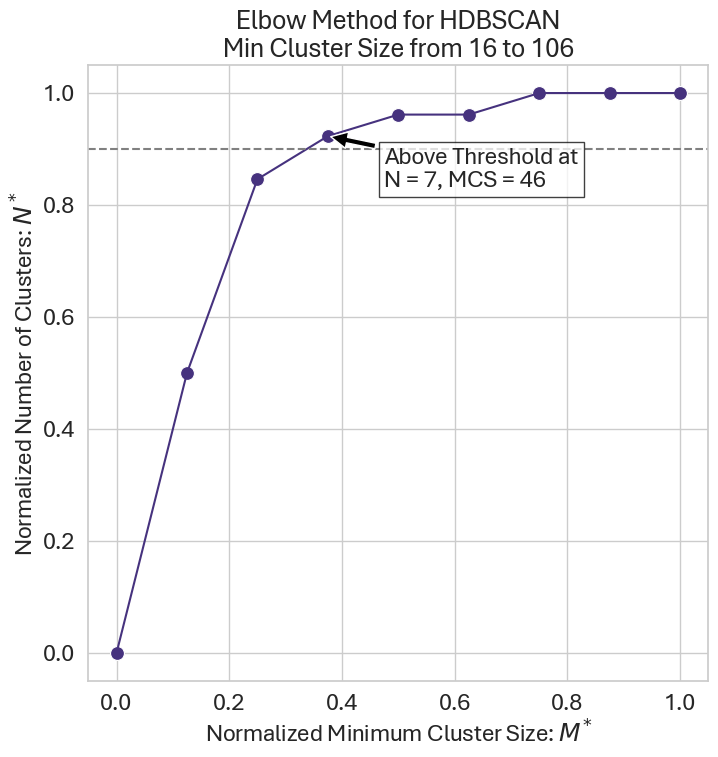

In [39]:
# BIC INVESTIGATION HERE
from project_modules._hdbscan_bic import make_plot

# we tend to centre on the sqrt of the number of data points
mcs_sqrt = int(1*int(np.sqrt(X.shape[0])))


make_plot(plot_df[["x", "y"]], 
          make_kneed_plot = False, 
          c_min = mcs_sqrt - 30, 
          c_max = mcs_sqrt + 60, 
          c_step = 10)

plt.savefig(f"{figdir}/ALL-HDBSCAN-elbow-plot.png", dpi = 600)

In [40]:
plot_df

,x,y,Cluster,Cluster Confidence,Site
0,10.886827,10.060935,4,0.921789,MTL
1,9.617863,11.725508,5,1.000000,MTL
2,11.869226,12.628811,5,0.000000,MTL
3,8.947426,11.094581,6,0.973296,MTL
4,11.997931,10.542110,4,0.982885,MTL
...,...,...,...,...,...
5659,11.894533,9.387194,4,0.981963,SAN
5660,9.636382,8.898794,7,0.000000,SAN
5661,12.070279,9.568502,4,0.995342,SAN
5662,11.912281,11.196840,5,0.863156,SAN


In [41]:
# how many clusters are there?
n_clusters_ALL = plot_df["Cluster"].nunique()
n_clusters_ALL

7

<Axes: title={'center': 'UMAP Dimension Reduction, HDBSCAN Clustering'}, xlabel='Dimension 1', ylabel='Dimension 2'>

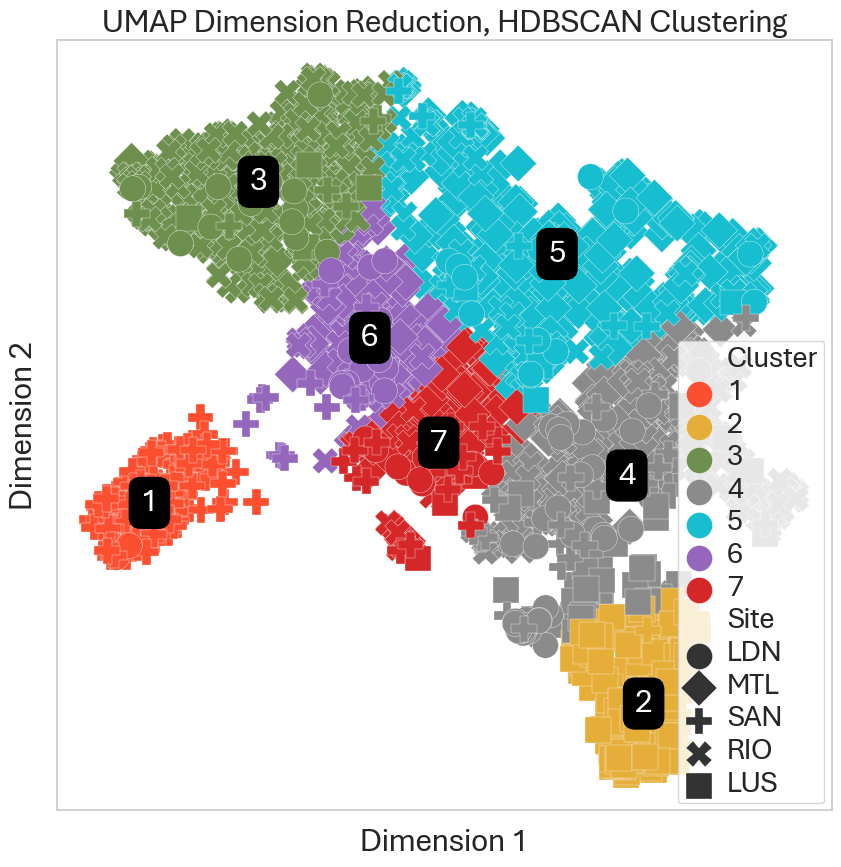

In [42]:
plot_clusters(plot_df, 
              site_name_dict, 
              palette_dict, 
              title        = f"UMAP Dimension Reduction, HDBSCAN Clustering", centroids    = True, 
              size_by_prob = False, 
              ax           = None,
              centroid_kws = {"alpha": 1.0, "palette_dict":None, "show_edge": False},)


# plt.set_title(f"UMAP Dimension Reduction, HDBSCAN Clustering", fontproperties=prop, fontsize = 24)
# # plt.savefig(f"{figdir}/tsne-hdbscan-umap.png", dpi = 300, bbox_inches = 'tight')

#### Cluster by Site

In [43]:
# count cluster members by site
cluster_by_site = plot_df.groupby("Cluster")["Site"].value_counts(normalize = False).unstack().T.fillna(0)#.astype(int)

cbs = cluster_by_site.copy()

# convert to percent of site
# cluster_by_site = cluster_by_site.div(cluster_by_site.sum(axis = 1), axis = 0)*100

# sort the index by the order in site_name_dict
cluster_by_site = cluster_by_site.loc[site_name_dict.values()]

print(cluster_by_site)

# output cluster_by_site to latex
# cluster_by_site.to_latex(f"{reportdir}/cluster-by-site.tex")
# plt.savefig(f"{figdir}/cluster-membership-tsne-hdbscan.png", dpi = 300, bbox_inches = 'tight')

Cluster      1      2      3      4      5      6      7
Site                                                    
LDN        2.0    1.0   14.0   53.0   12.0   17.0   11.0
MTL        0.0    0.0   75.0  164.0  399.0  130.0  127.0
SAN      191.0    1.0    8.0   22.0    9.0   16.0   19.0
RIO        1.0    0.0  335.0  182.0   79.0   26.0   27.0
LUS        0.0  213.0    4.0   44.0    4.0    0.0    3.0


In [49]:
px1 = plot_df.copy()
px1["ID"] = px1.index
px1

,x,y,Cluster,Cluster Confidence,Site,ID
0,10.886827,10.060935,4,0.921789,MTL,0
1,9.617863,11.725508,5,1.000000,MTL,1
2,11.869226,12.628811,5,0.000000,MTL,2
3,8.947426,11.094581,6,0.973296,MTL,3
4,11.997931,10.542110,4,0.982885,MTL,4
...,...,...,...,...,...,...
5659,11.894533,9.387194,4,0.981963,SAN,5659
5660,9.636382,8.898794,7,0.000000,SAN,5660
5661,12.070279,9.568502,4,0.995342,SAN,5661
5662,11.912281,11.196840,5,0.863156,SAN,5662


In [50]:
# sort by order in site_name_dict
cbs = cbs.loc[site_name_dict.values()]

# rename index values using site_fullname_dict
cbs.index = cbs.index.map(site_fullname_dict)
cbs = cbs.astype(int)

# cbs.to_latex(f"{reportdir}/basic-cluster-by-site.tex")

In [51]:
c1 = plot_df.groupby("Cluster")["Site"].value_counts(normalize = True).unstack().T.fillna(0)#.astype(int)
c1 = c1.loc[site_name_dict.values()]
c1

Cluster,1,2,3,4,5,6,7
Site,,,,,,,
LDN,0.010309,0.004651,0.032110,0.113978,0.023857,0.089947,0.058824
MTL,0.000000,0.000000,0.172018,0.352688,0.793241,0.687831,0.679144
SAN,0.984536,0.004651,0.018349,0.047312,0.017893,0.084656,0.101604
RIO,0.005155,0.000000,0.768349,0.391398,0.157058,0.137566,0.144385
LUS,0.000000,0.990698,0.009174,0.094624,0.007952,0.000000,0.016043


#### RFC Model to identify features that differentiate clusters

In [52]:
X.columns

Index(['CD-acute_kidney_injury___1', 'CD-acute_kidney_injury___2',
       'CD-acute_respiratory_distress___1',
       'CD-acute_respiratory_distress___2', 'CD-adjunctive___1',
       'CD-anemia___1', 'CD-anemia___2', 'CD-anxiety___1', 'CD-anxiety___2',
       'CD-asthma___1',
       ...
       'SYMPT-seizure___2', 'SYMPT-shortness_of_breath_dyspne___2',
       'SYMPT-skin_rash___2', 'SYMPT-sore_throat___2',
       'SYMPT-trouble_speaking_aphasia_d___2', 'SYMPT-weight_loss___2',
       'SYMPT-wheezing_or_stridor___2', 'VAX-vaccinated', 'age', 'sex'],
      dtype='object', length=245)

In [53]:
# use a random forest classifier to find the most important features
from sklearn.ensemble import RandomForestClassifier

# use all cores
clf = RandomForestClassifier(n_jobs=-1, 
                            #  n_estimators = 100, 
                            #  class_weight='balanced', 
                             max_depth=7
                             )



# instantiate the Boruta feature selector
from boruta_py.boruta import BorutaPy

boruta = BorutaPy(clf, 
                #   n_estimators = 1_000, 
                  n_estimators = 'auto',
                  verbose      = 1, 
                  random_state = 42, 
                  perc         = 100
                  )
boruta.fit(X, cluster_labels)

Iteration: 1 / 100
Iteration: 2 / 100
Iteration: 3 / 100
Iteration: 4 / 100
Iteration: 5 / 100
Iteration: 6 / 100
Iteration: 7 / 100
Iteration: 8 / 100
Iteration: 9 / 100
Iteration: 10 / 100
Iteration: 11 / 100
Iteration: 12 / 100
Iteration: 13 / 100
Iteration: 14 / 100
Iteration: 15 / 100
Iteration: 16 / 100
Iteration: 17 / 100
Iteration: 18 / 100
Iteration: 19 / 100
Iteration: 20 / 100
Iteration: 21 / 100
Iteration: 22 / 100
Iteration: 23 / 100
Iteration: 24 / 100
Iteration: 25 / 100
Iteration: 26 / 100
Iteration: 27 / 100
Iteration: 28 / 100
Iteration: 29 / 100
Iteration: 30 / 100
Iteration: 31 / 100
Iteration: 32 / 100


BorutaPy finished running.

Iteration: 	33 / 100
Confirmed: 	37
Tentative: 	0
Rejected: 	208


BorutaPy(estimator=RandomForestClassifier(max_depth=7, n_estimators=124,
                                          n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x321472E40),
         n_estimators='auto', random_state=RandomState(MT19937) at 0x321472E40,
         verbose=1)

In [111]:
# make a subset of the data with the important features and 
# fit a classifiera on it, using the cluster labels as the target
important_features = X.columns[boruta.support_]
clf.fit(X[important_features], cluster_labels)

RandomForestClassifier(max_depth=7, n_estimators=124, n_jobs=-1,
                       random_state=RandomState(MT19937) at 0x320F62A40)

In [112]:
important_features

Index(['CD-fio2', 'CD-medication_received___1', 'CD-medication_received___3',
       'CD-medication_received___4', 'CD-medication_received___5',
       'CD-required_oxygen', 'CD-spo2', 'CD-type_of_care___2',
       'HHX-Arterial Hypertension', 'HHX-Coronary artery disease',
       'HHX-OTHER-hypo', 'HHX-Other', 'HHX-Psychiatric disease',
       'MED-Cardiovascular-agents', 'SUBST-1', 'SYMPT-abdominal_pain___2',
       'SYMPT-chest_pain___2', 'SYMPT-confusion_altered_mental_s___2',
       'SYMPT-dizziness___2', 'SYMPT-ear_pain___2',
       'SYMPT-extremity_weakness_or_numb___2', 'SYMPT-fatigue___2',
       'SYMPT-fever_38_0oc___2', 'SYMPT-headache___2',
       'SYMPT-joint_pain_arthralgia___2', 'SYMPT-loss_of_appetite___2',
       'SYMPT-loss_of_taste_lost_of_smel___2',
       'SYMPT-muscle_aches_myalgia___2', 'SYMPT-nausea_vomiting___2',
       'SYMPT-night_sweats___2', 'SYMPT-shortness_of_breath_dyspne___2',
       'SYMPT-sore_throat___2', 'SYMPT-weight_loss___2',
       'SYMPT-wheezi

In [113]:
# plot_df.drop(columns = ["site"], inplace = True)
# plot_df["site"] = plot_df["Site"]

In [114]:
fi_df1 = make_feature_importance_df(clf, important_features)
features20 = make_topN_features(fi_df1, 20, feature_map, feature_colour_map)


In [115]:
features20

,Feature,Importance,OLD Feature,Colour
0,Weakness/Numbness,1.000000,SYMPT-extremity_weakness_or_numb___2,"[0.866667, 0.0, 1.0]"
1,Fatigue,0.951924,SYMPT-fatigue___2,"[0.392157, 0.266667, 0.380392]"
2,CoV Non-ICU,0.632524,CD-type_of_care___2,"[0.776471, 0.741176, 1.0]"
3,Arthralgia,0.606366,SYMPT-joint_pain_arthralgia___2,"[0.807843, 0.521569, 1.0]"
4,Dizziness,0.533424,SYMPT-dizziness___2,"[0.784314, 0.509804, 0.435294]"
5,Myalgia,0.465597,SYMPT-muscle_aches_myalgia___2,"[0.584314, 0.827451, 1.0]"
6,Altered Mental Status,0.336825,SYMPT-confusion_altered_mental_s___2,"[0.670588, 0.447059, 0.0]"
7,Weight Loss,0.298312,SYMPT-weight_loss___2,"[1.0, 0.47451, 0.560784]"
8,CoV Oxygen,0.284430,CD-required_oxygen,"[0.121569, 0.466667, 0.705882]"
9,Sex,0.284029,sex,"[0.580392, 0.0, 0.960784]"


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Site is not in the list of features
0     SYMPT-extremity_weakness_or_numb___2
1                        SYMPT-fatigue___2
2                      CD-type_of_care___2
3          SYMPT-joint_pain_arthralgia___2
4                      SYMPT-dizziness___2
5           SYMPT-muscle_aches_myalgia___2
6     SYMPT-confusion_altered_mental_s___2
7                    SYMPT-weight_loss___2
8                       CD-required_oxygen
9                                      sex
10              CD-medication_received___5
11                          VAX-vaccinated
12              CD-medication_received___3
13    SYMPT-shortness_of_breath_dyspne___2
14                                 CD-spo2
15               HHX-Arterial Hypertension
16    SYMPT-loss_of_taste_lost_of_smel___2
17               MED-Cardiovascular-agents
18                                     age
19                  SYMPT-night_sweats___2
Name: Feature, dtype: object
./OUTPUT/lc-pos-figures/2025-03-18/ALL-FI-7c-600dpi-2025-03-18.png
./OUTPUT

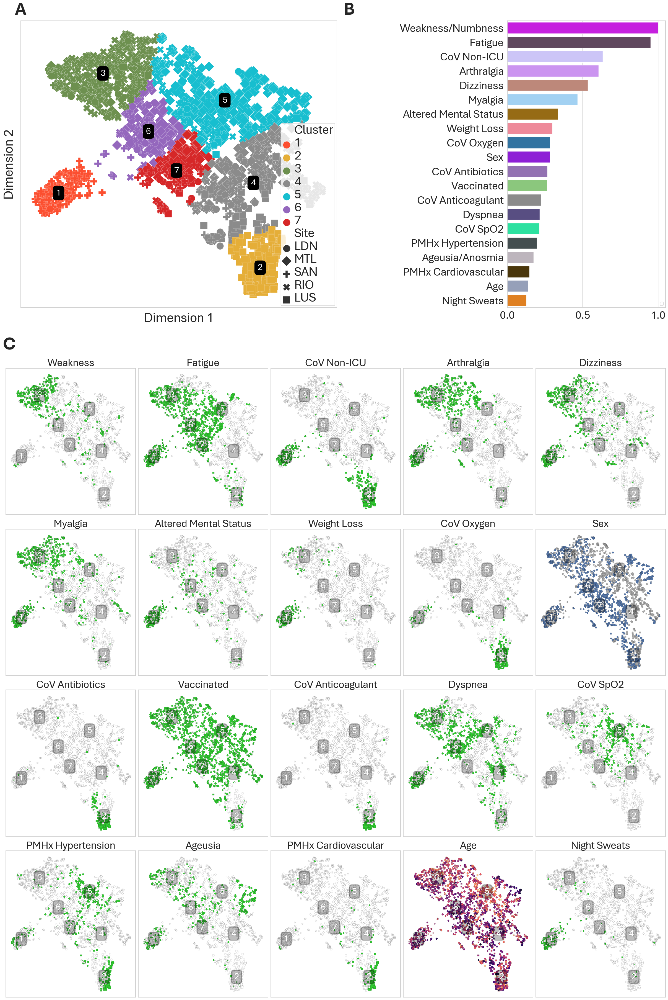

In [116]:
fig     = plt.figure(layout="constrained", figsize=(24,36))
subfigs = fig.subfigures(2, 1, wspace=0.05, height_ratios=[2,4], hspace = 0.05)

axs0 = subfigs[0].subplots(1, 2, width_ratios=[2,1])
# subfigs[0].set_facecolor('lightblue')

plot_clusters(plot_df, 
              site_name_dict, 
              palette_dict, 
              title = None, 
              centroids = True, 
              size_by_prob = False, 
              ax = axs0[0],
              FONTSIZE = FONTSIZE*1.5,)
# add annotation abve the plot
axs0[0].annotate("A",
                    xy=(0.0, 1.01), 
                    xycoords='axes fraction',
                    xytext=(0.0,0.0), 
                    textcoords = 'offset points',
                    fontsize = FONTSIZE*2,
                    horizontalalignment='center', 
                    verticalalignment='bottom',
                    fontweight = "bold",
                    )

plot_feature_importances(features20, 
                         feature_map, 
                         feature_colour_map, 
                         axs0[1], 
                         FONTSIZE*1.25)


axs0[1].annotate("B",
                    xy=(-1.0, 1.01), 
                    xycoords='axes fraction',
                    xytext=(0.0,0.0), 
                    textcoords = 'offset points',
                    fontsize = FONTSIZE*2,
                    horizontalalignment='center', 
                    verticalalignment='bottom',
                    fontweight = "bold",
                    )


# make an array of axes for the second subfigure
axs1 = subfigs[1].subplots(4,5)

plot_multiple_features(fi_df1, 
                        X,
                        plot_df, 
                        feature_map, 
                        site_name_dict,
                        site_style_dict,
                        highlight_colour = "limegreen",
                        ax = axs1,
                        subfig_label = " ",
                        fontsize = FONTSIZE*1.2,
                        )

# subfigs[1].suptitle(" ")
subfigs[1].suptitle('C', fontsize=FONTSIZE*2, fontweight='bold', x = 0.0, y = 1.02, ha='left', va='top')
# plt.show()

SAVE = True

if SAVE:

    for dpi in [600, 300]:

        fn = f"{figdir}/ALL-FI-{n_clusters_ALL}c-{dpi}dpi-{timestamp}.png"
        print(fn)
        plt.savefig(fn, dpi = dpi, bbox_inches = 'tight')



### Excursion Plots

In [117]:
# make a table of features and their importances from the classifier
fi_df = pd.DataFrame(clf.feature_importances_, 
                     index = clf.feature_names_in_, 
                     columns = ["Importance"])

# fi_df = make_feature_importance_df(clf, important_features)

# make a table of all of the features and their rankings
feature_ranking_table = pd.DataFrame({
                        "Feature": X.columns, 
                        "Ranking": boruta.ranking_, 
                        "Importance":boruta.support_, })


# fill fff with the feature importances
# start with zero
feature_ranking_table["FI"] = 0.0

# now fill in the numeric values for the important features
for i, f in feature_ranking_table.iterrows():
    if f["Importance"] == True:
        # print(i,f["Feature"], fi_df.loc[f["Feature"]]["Importance"])
        feature_ranking_table.loc[i, "FI"] = fi_df.loc[f["Feature"]]["Importance"]

# sort by FI
feature_ranking_table.sort_values(by = "FI", ascending = False, inplace = True)

In [118]:
# save the cluster labels to a copy of the original dataframe
A = X.copy()
M = X.copy()

# sosrt columns in the order set in fff
M = M[feature_ranking_table["Feature"]]

# augment with cluster labels
A["cluster"] = [c+1 for c in cluster_labels]
M["cluster"] = [c+1 for c in cluster_labels]


In [119]:
cluster_by_site

Cluster,1,2,3,4,5,6,7
Site,,,,,,,
LDN,2.0,1.0,14.0,53.0,12.0,17.0,11.0
MTL,0.0,0.0,75.0,164.0,399.0,130.0,127.0
SAN,191.0,1.0,8.0,22.0,9.0,16.0,19.0
RIO,1.0,0.0,335.0,182.0,79.0,26.0,27.0
LUS,0.0,213.0,4.0,44.0,4.0,0.0,3.0


In [120]:
cluster_membership_by_site = cluster_by_site.T/cluster_by_site.sum(axis = 1)*100

# rename the index column
cluster_membership_by_site.index.name = "cluster"

# map the site_fullname_dict to the index
cluster_membership_by_site.columns = cluster_membership_by_site.columns.map(site_fullname_dict)
cluster_membership_by_site = cluster_membership_by_site.T
# round to 1 decimal place
cluster_membership_by_site = cluster_membership_by_site.round(1)

cluster_membership_by_site

cluster,1,2,3,4,5,6,7
Site,,,,,,,
London,1.8,0.9,12.7,48.2,10.9,15.5,10.0
Montreal,0.0,0.0,8.4,18.3,44.6,14.5,14.2
San Diego,71.8,0.4,3.0,8.3,3.4,6.0,7.1
Rio de Janeiro,0.2,0.0,51.5,28.0,12.2,4.0,4.2
Lusaka,0.0,79.5,1.5,16.4,1.5,0.0,1.1


In [121]:
feature_prev_by_cluster = M.groupby("cluster").mean()

# get the first 20 columns
feature_prev_by_cluster = feature_prev_by_cluster[feature_ranking_table["Feature"][:20]]

# rename the columns
for c in feature_prev_by_cluster.columns:
    feature_prev_by_cluster.rename(columns = {c: feature_map[c]}, inplace = True)

# drop age and sex
# feature_prev_by_cluster = feature_prev_by_cluster.drop(columns = ["Age", "Sex"])
feature_prev_by_cluster = feature_prev_by_cluster.drop(columns = ["Age"])

In [122]:
feature_prev_by_cluster

,Weakness/Numbness,Fatigue,CoV Non-ICU,Arthralgia,Dizziness,Myalgia,Altered Mental Status,Weight Loss,CoV Oxygen,Sex,CoV Antibiotics,Vaccinated,CoV Anticoagulant,Dyspnea,CoV SpO2,PMHx Hypertension,Ageusia/Anosmia,PMHx Cardiovascular,Night Sweats
cluster,,,,,,,,,,,,,,,,,,,
1,0.020619,0.989691,0.927835,0.747423,0.840206,0.845361,0.902062,0.768041,0.237113,0.706186,0.015464,0.953608,0.000000,0.737113,0.000000,0.309278,0.494845,0.030928,0.613402
2,0.018605,0.167442,0.790698,0.046512,0.041860,0.051163,0.041860,0.009302,0.706977,0.553488,0.632558,0.223256,0.520930,0.209302,0.000000,0.567442,0.046512,0.548837,0.023256
3,0.805046,0.779817,0.013761,0.786697,0.736239,0.795872,0.052752,0.096330,0.006881,0.626147,0.002294,0.938073,0.002294,0.628440,0.082569,0.036697,0.293578,0.009174,0.022936
4,0.073118,0.068817,0.122581,0.015054,0.118280,0.126882,0.038710,0.012903,0.027957,0.460215,0.036559,0.903226,0.002151,0.322581,0.083871,0.103226,0.083871,0.034409,0.010753
5,0.063618,0.544732,0.013917,0.254473,0.097416,0.180915,0.047714,0.017893,0.000000,0.373757,0.003976,0.978131,0.001988,0.399602,0.401590,0.349901,0.294235,0.007952,0.001988
6,0.116402,0.968254,0.074074,0.243386,0.280423,0.227513,0.232804,0.010582,0.010582,0.867725,0.000000,0.978836,0.000000,0.878307,0.121693,0.089947,0.264550,0.000000,0.037037
7,0.053476,0.844920,0.032086,0.197861,0.117647,0.085561,0.122995,0.016043,0.026738,0.957219,0.000000,0.957219,0.000000,0.037433,0.192513,0.213904,0.144385,0.042781,0.026738


./OUTPUT/lc-pos-figures/2025-03-18/ALL-FPrev-by-cluster-7c-600dpi-2025-03-18.png
./OUTPUT/lc-pos-figures/2025-03-18/ALL-FPrev-by-cluster-7c-300dpi-2025-03-18.png


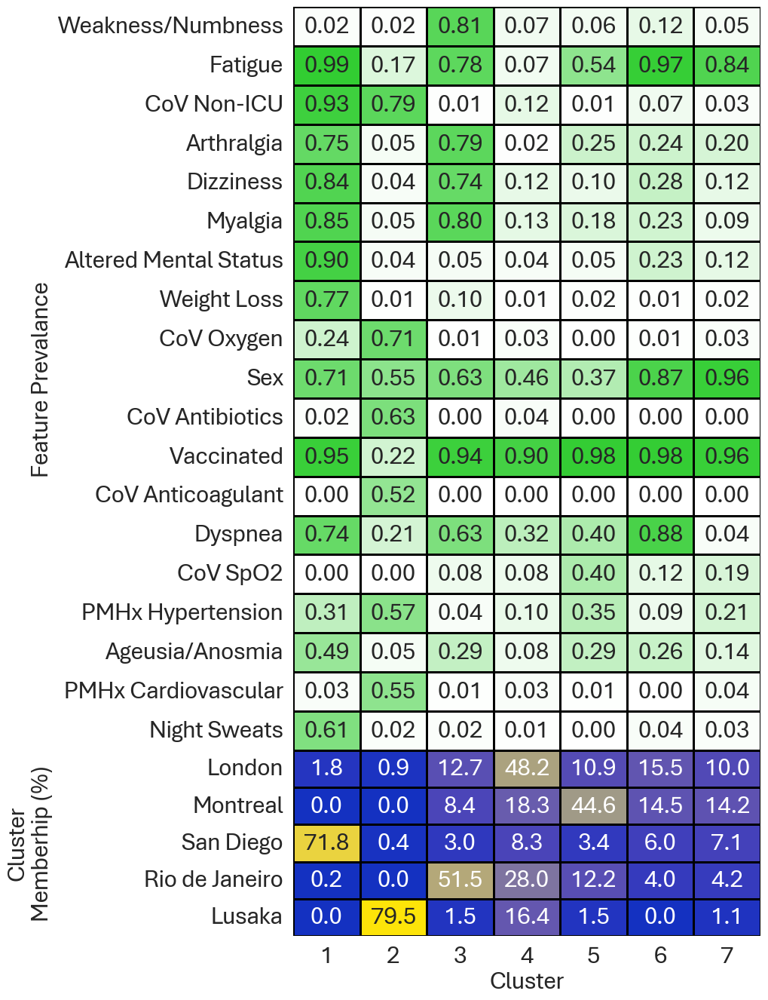

In [123]:


fig, (axs0, axs1) = plt.subplots(2, 1, figsize=(8,16),  sharex = True, height_ratios=[8,2])
fig.subplots_adjust(hspace = 0.0)

sns.heatmap(feature_prev_by_cluster.T, 
            cmap = cmap, 
            ax = axs0, 
            cbar = False, 
            vmin = 0, 
            linewidth = 1, 
            # linewidth = 0.5, 
            square = False, 
            linecolor = 'k',
              annot = True,
                fmt = ".2f",
                annot_kws = {"fontsize": 24}
)

# turn off the xticks and x label
axs0.set_xticks([]); axs0.set_xlabel("")

sns.heatmap(cluster_membership_by_site,
            # cmap = 'viridis', 
            cmap = cc.cm.bjy, 
            ax = axs1, 
            cbar = False, 
            vmin = 0, 
            linewidth = 1, 
            # linewidth = 0.5, 
            square = False, 
            linecolor = 'k',
              annot = True,
                fmt = ".1f",
                annot_kws = {"fontsize": 24}
)
axs0.set_ylabel("Feature Prevalance", fontsize = FONTSIZE)
axs1.set_ylabel("Cluster\nMemberhip (%)", fontsize = FONTSIZE)
# rotate axs1 yticks 90 degrees
axs1.set_yticklabels(axs1.get_yticklabels(), rotation = 00)

# make x axis label alrger
axs1.set_xlabel("Cluster", fontsize = FONTSIZE)
#make tick labels larger
axs1.tick_params(axis='both', which='major', labelsize=FONTSIZE)
axs0.tick_params(axis='both', which='major', labelsize=FONTSIZE)

# fig.align_xlabels()

# align the ylabels
fig.align_ylabels()

# output the figure
# plt.savefig(f"{figdir}/feature-prevalence-by-cluster-600.png", dpi = 600, bbox_inches = 'tight')
# plt.savefig(f"{figdir}/feature-prevalence-by-cluster-300.png", dpi = 300, bbox_inches = 'tight')

for dpi in [600, 300]:

    fn = f"{figdir}/ALL-FPrev-by-cluster-{n_clusters_ALL}c-{dpi}dpi-{timestamp}.png"
    print(fn)
    plt.savefig(fn, dpi = dpi, bbox_inches = 'tight')


# By SITE for subphenotypes at each site

In [124]:
# select the columns to use
LC_COLUMNS = LC_pos_.columns

# remove SITE from LC_COLUMNS
LC_COLUMNS = LC_COLUMNS.drop(["SITE", "age"])

In [125]:
# cluster pipeline, iterating over the sites

result_dict = {}

for i, (k,v) in enumerate(site_name_dict.items()):
    # print(i, k, v)

    print(f"Site {k}: {v}")

    # LC_pos_ = df.query(f"SITE == {k}").copy()
    the_data = LC_pos_.query(f"SITE == {k}").copy()

    # drop age
    the_data = the_data.drop(columns = ["age"])


    X = scaler.fit_transform(the_data)     # type: ignore
    X = X.dropna(axis = 0)
    X = X[LC_COLUMNS]

    print(f"Data shape = {the_data.shape}")
    print(f"X shape    = {X.shape}")


    # reduce and cluster
    # sklearn pipelines
    min_cluster_size = int(np.sqrt(X.shape[0]))

    hdb_parms = {
                    # min_cluster_size is roughly 
                    # sqrt(n) where n is the number of samples
                    'min_cluster_size': min_cluster_size, 
                    'min_samples': min_cluster_size,
                    'cluster_selection_method': 'leaf', # more granular
                    'cluster_selection_epsilon': 0.1,
                }

    umap_parms = {
                    'n_components': 2,
                    'spread':       1.0,
                    'random_state': 42,
                    # 'metric':      'euclidean',
                    # 'metric':      'hamming',
                    'verbose':      False
                }

    # turn off userwarnings from umap
    import warnings
    warnings.filterwarnings("ignore")
    
    # instantiate the pipeline
    pipe = Pipeline([
                    ('scaler', MinMaxScaler()),
                    ('embed', UMAP(**umap_parms)),
                    ('cluster', HDBSCAN(**hdb_parms, prediction_data = True)),
                    ])

    # apply to the feature dataframe
    pipe.fit(X)

    # get the plot dataframe and cluster labels
    sites = LC_pos_.loc[X.index]["SITE"].map(site_name_dict)
    plot_df, cluster_labels = make_plot_df(pipe, sites, site_name_dict)

    # what fraction of the data is in each cluster?
    # print(plot_df["Cluster"].value_counts(normalize = True)*100)

    # use all cores
    clf = RandomForestClassifier(n_jobs=-1, 
                                #  n_estimators = 100, 
                                #  class_weight='balanced', 
                                max_depth=7
                                )

    # instantiate the Boruta feature selector
    from boruta_py.boruta import BorutaPy

    boruta = BorutaPy(clf, 
                    #   n_estimators = 1_000, 
                    n_estimators = 'auto',
                    verbose      = 0, 
                    random_state = 42, 
                    perc         = 100
                    )
    boruta.fit(X, cluster_labels)

    # make a subset of the data with the important features and 
    # fit a classifiera on it, using the cluster labels as the target
    important_features = X.columns[boruta.support_]
    clf.fit(X[important_features], cluster_labels)

    # print(important_features, clf.feature_importances_)

    # # make a heatmap 0f the mean value per feature per cluster
    M = X.copy()

    # # sosrt columns in the order set in fff
    M = M[important_features]

    # # augment with cluster labels
    M["cluster"] = [c+1 for c in cluster_labels]

    # # get the mean value of each feature per cluster
    mfv = M.groupby("cluster").mean()



    case_dict = {'plot_df': plot_df, 
                 'important_features': important_features,
                 'mfv': mfv,
                 'classifier': clf, 
                 'boruta': boruta, 
                 'X': X,
                 'cluster_labels': cluster_labels,
                 }

    result_dict.update({v: case_dict})

# plt.show()

Site 1: LDN
Data shape = (110, 245)
X shape    = (110, 244)
Site 2: MTL
Data shape = (895, 245)
X shape    = (895, 244)
Site 3: SAN
Data shape = (266, 245)
X shape    = (266, 244)
Site 4: RIO
Data shape = (651, 245)
X shape    = (650, 244)
Site 5: LUS
Data shape = (272, 245)
X shape    = (272, 244)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, -1.3885555555556035, 'Relative Importance')

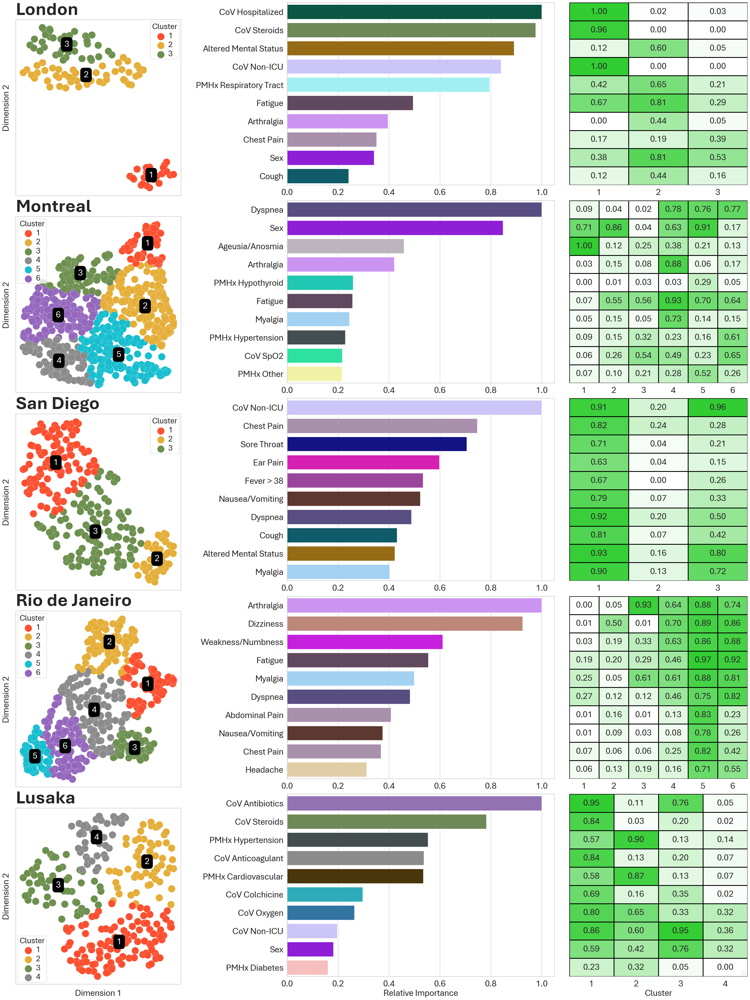

In [126]:
# make the figure

fig     = plt.figure(layout="constrained", figsize=(27,36), )
subfigs = fig.subfigures(1,3, wspace=0.05, hspace = 0.1, width_ratios=[1,2,1])

axl = subfigs[0].subplots(5, 1)
axc = subfigs[1].subplots(5, 1, sharex = False)
axr = subfigs[2].subplots(5, 1, sharex = False)

for i,item in enumerate(result_dict.items()):

    k, v = item

    plot_df            = v['plot_df']
    important_features = v['important_features']
    X                  = v['X']

    # clusters
    plot_clusters(plot_df, 
                  site_name_dict, 
                  palette_dict,
                  title        = None, 
                  centroids    = True, 
                  size_by_prob = False, 
                  ax           = axl[i], 
                  style        = None
                  )
    # turn off the x label
    axl[i].set_xlabel("", fontsize = FONTSIZE)

    # feature importances
    fi_df = make_feature_importance_df(v['classifier'], v['important_features'])
    # select only the top10 features
    features10 = make_topN_features(fi_df, 
                                    10, 
                                    feature_map, 
                                    feature_colour_map)

    plot_feature_importances(features10, 
                             feature_map, 
                             feature_colour_map, 
                             axc[i], 
                             FONTSIZE)

    # the mean feature values
    # mfv = X[important_features].mean()

    # # make a heatmap 0f the mean value per feature per cluster
    M = X.copy()
    M = M[important_features]
    # # augment with cluster labels
    M["cluster"] = [c+1 for c in v['cluster_labels']]
    # # get the mean value of each feature per cluster
    mfv = M.groupby("cluster").mean()


    # sort the mfv columns by the order of the important features
    mfv = mfv[features10["OLD Feature"]]

    # print(features10["Feature"], features10["OLD Feature"])

    # print(mfv)

    # map the feature names to the new names
    mfv.columns = features10["Feature"]

    # heatmaps
    sns.heatmap(mfv.T,
                cmap = cmap, 
                # ax = ax, 
                cbar = False, 
                vmin = 0, 
                linewidth = 1, 
                # linewidth = 0.5, 
                square = False, 
                linecolor = 'k',
                annot = True,
                fmt = ".2f",
                annot_kws = {"fontsize": 24},
                ax = axr[i]
    )

    # turn off the y axis label
    axr[i].set_ylabel("", fontsize = FONTSIZE)

    # turn off y ticks
    axr[i].set_yticks([])

    #make tick labels larger
    axr[i].tick_params(axis='both', which='major', labelsize=FONTSIZE)
    axr[i].set_xlabel("", fontsize = FONTSIZE)


    axl[i].annotate(f"{site_fullname_dict[k]}",
                        xy=(0.0, 1.01), 
                        xycoords='axes fraction',
                        xytext=(0.0,0.0), 
                        textcoords = 'offset points',
                        fontsize = FONTSIZE*2,
                        horizontalalignment='left', 
                        verticalalignment='bottom',
                        fontweight = "bold",
                        )



axl[4].set_xlabel("Dimension 1", fontsize = FONTSIZE)
axr[4].set_xlabel("Cluster", fontsize = FONTSIZE)
axc[4].set_xlabel("Relative Importance", fontsize = FONTSIZE)

# for dpi in [600, 300]:

#     fn = f"{figdir}/SUBPHENOTYPE-ALL-FI-by-site-{dpi}dpi-{timestamp}.png"
#     print(fn)
#     plt.savefig(fn, dpi = dpi, bbox_inches = 'tight')




# By SYMPTOM Status

In [54]:
# we need to agglomorate into a reasonable number of clusters
# this factor does so
factor = 3

In [55]:
# list of feature names that are symptoms that are new or worse in the LC+ population
lc_symptoms = [f for f in LC_pos_.columns if f.startswith("SYMPT-") and f.endswith("___2")]

In [56]:
# select only the features in new_and_worse
X = LC_pos_[lc_symptoms].copy()
print(X.shape)

# drop rows with missing values
X.dropna(inplace = True, axis = 0)
print(X.shape)

# drop rows with all zeros
# X = X.loc[(X != 0).any(axis = 1)]
print(X.shape)

(2194, 28)
(2194, 28)
(2194, 28)


In [57]:
# # drop certain features

# # drop features that contain adjunctive
# X = X.drop(columns = X.filter(regex = 'adjunctive').columns)

# # drop features that contain "medication_received"
# X = X.drop(columns = X.filter(regex = 'medication_received').columns)

# # drop features that contain "type_of_care"
# X = X.drop(columns = X.filter(regex = 'type_of_care').columns)

# # drop features that contain "ventilatory_support_type"
# X = X.drop(columns = X.filter(regex = 'ventilatory_support_type').columns)

# print(X.shape)

In [58]:
# cluster pipeline


min_cluster_size = int(np.sqrt(X.shape[0]))*factor

print(f"MCS = {min_cluster_size}")



hdb_parms = {
                # min_cluster_size is roughly 
                # sqrt(n) where n is the number of samples
                'min_cluster_size': min_cluster_size, 
                'min_samples':      min_cluster_size,
                'cluster_selection_method': 'leaf',
                'cluster_selection_epsilon': 0.5,
            }

umap_parms = {
                'n_components': 2,
                'spread':       1.0,
                'random_state': 42,
                'min_dist':     0.25,
                # 'metric': 'cosine',
                # 'metric': 'hamming',
            }

# define the transformer
umap_transformer = UMAP(**umap_parms, verbose = True)
embedding_model = umap_transformer

# instantiate the pipeline
pipe = Pipeline([
                ('scaler', MinMaxScaler()),
                ('embed', embedding_model),
                ('cluster', HDBSCAN(**hdb_parms, prediction_data = True)),
                ])

# apply to the feature dataframe
pipe.fit(X)

# get the dataframe and the labels
sites = LC_pos_.loc[X.index]["SITE"].map(site_name_dict)
plot_df, cluster_labels = make_plot_df(pipe, sites, site_name_dict)

n_clust = max(cluster_labels)+1

MCS = 138
UMAP(min_dist=0.25, random_state=42, verbose=True)
Thu Mar 20 12:36:06 2025 Construct fuzzy simplicial set


/Users/david/mambaforge/envs/clust/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Mar 20 12:36:07 2025 Finding Nearest Neighbors
Thu Mar 20 12:36:07 2025 Finished Nearest Neighbor Search
Thu Mar 20 12:36:07 2025 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Mar 20 12:36:16 2025 Finished embedding


In [59]:
px2 = plot_df.copy()

px2["ID"] = px2.index
px2

,x,y,Cluster,Cluster Confidence,Site,ID
0,-9.570189,-8.877527,4,0.423111,MTL,0
1,28.282980,5.041941,1,1.000000,MTL,1
2,-13.723831,-16.131525,3,1.000000,MTL,2
3,27.308661,4.239827,1,1.000000,MTL,3
4,-9.552098,-9.036632,4,0.444988,MTL,4
...,...,...,...,...,...,...
5659,-4.673128,-1.932577,4,0.968659,SAN,5659
5660,3.585445,-25.446890,2,0.744179,SAN,5660
5661,-2.668866,-0.044236,4,0.962933,SAN,5661
5662,-5.764950,-6.691644,4,0.850379,SAN,5662


In [75]:
# join px1 and px2 on the ID column, and compare counts of site1 and site2
pxqq = px1.merge(px2, on = "ID", suffixes = ["_1", "_2"])

pxqq.head()

,x_1,y_1,Cluster_1,Cluster Confidence_1,Site_1,ID,x_2,y_2,Cluster_2,Cluster Confidence_2,Site_2
0,10.886827,10.060935,4,0.921789,MTL,0,-9.570189,-8.877527,4,0.423111,MTL
1,9.617863,11.725508,5,1.000000,MTL,1,28.282980,5.041941,1,1.000000,MTL
2,11.869226,12.628811,5,0.000000,MTL,2,-13.723831,-16.131525,3,1.000000,MTL
3,8.947426,11.094581,6,0.973296,MTL,3,27.308661,4.239827,1,1.000000,MTL
4,11.997931,10.542110,4,0.982885,MTL,4,-9.552098,-9.036632,4,0.444988,MTL


In [ ]:
# retain ID, Cluster_1, Cluster_2
pxqq = pxqq[["ID", 'Cluster_1', 'Cluster_2', "Site_1"]]


# convert Cluster_1 to str labels by prepending "All-"
pxqq["Cluster_1"] = "All-" + pxqq["Cluster_1"].astype(str)

pxqq["Cluster_2"] = "Symptom-" + pxqq["Cluster_2"].astype(str)

pxqq

,ID,Cluster_1,Cluster_2,Site_1
0,0,4,4,MTL
1,1,5,1,MTL
2,2,5,3,MTL
3,3,6,1,MTL
4,4,4,4,MTL
...,...,...,...,...
2184,5659,4,4,SAN
2185,5660,7,2,SAN
2186,5661,4,4,SAN
2187,5662,5,4,SAN


In [77]:
# # write pxqq to a csv file

pxqq.to_csv(f"./pxqq.csv")

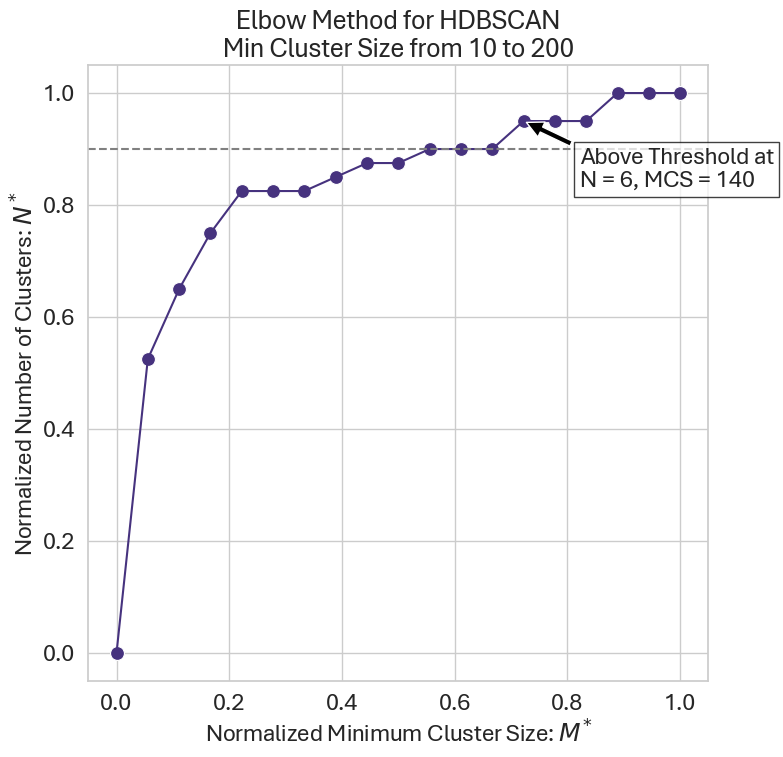

In [132]:
make_plot(plot_df[["x", "y"]],
          make_kneed_plot = False, 
          c_min = 10, 
          c_max = 200, 
          c_step = 10)

# save the figure
plt.savefig(f"{figdir}/SYMPTOM-HDBSCAN-elbow-plot.png", dpi = 600)

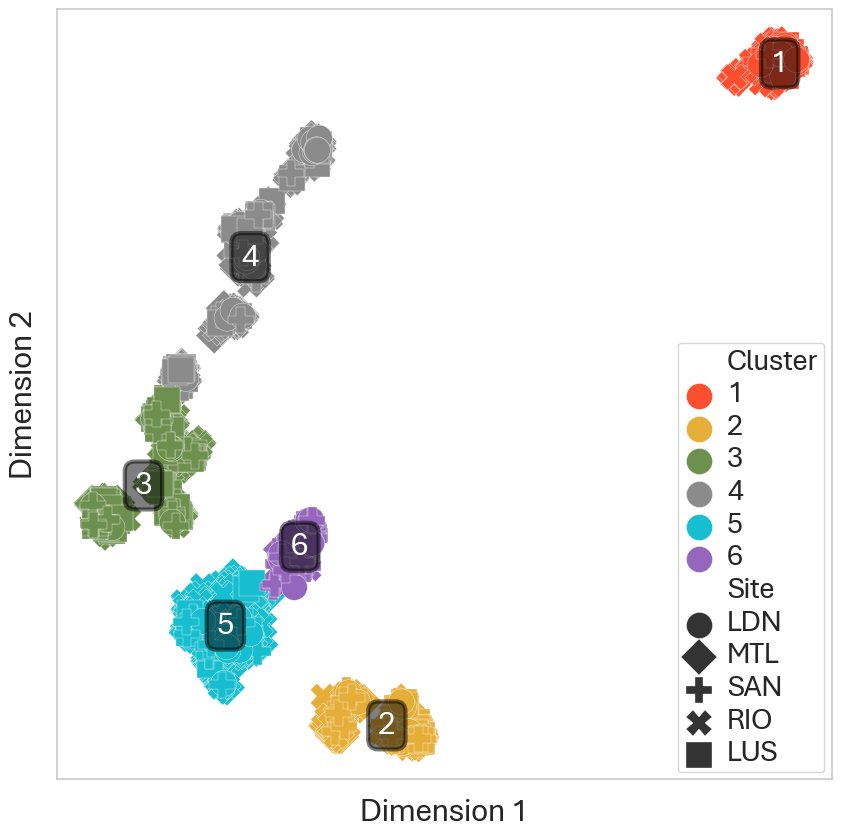

In [133]:
# plot the clusters
aa = plot_clusters(plot_df, 
              site_name_dict, 
              palette_dict, 
            #   title = f"New and Worsening Symptoms only, N = {X.shape[0]:2d}", 
            #   title = f"New and Worsening Symptoms only, N = {X.shape[0]:2d}", 
              centroids = True, 
              size_by_prob = False, 
              ax = None,
              centroid_kws = {"alpha": 0.5, "palette_dict":None, "show_edge": True},)

# save as a pdf
# plt.savefig(f"{figdir}/new-and-worse-symptoms-umap-hdbscan-{n_clust}c-{timestamp}.pdf", dpi = 300, bbox_inches = 'tight')

In [134]:
df.drop(columns=['C'], errors='ignore')


,sex,age,SITE,MED-Analgesics,MED-Anesthetics,MED-Antibacterials,MED-Anticonvulsants,MED-Antidepressants,MED-Antifungals,MED-Antimigraine-agents,...,LABS-IND-troponint,LABS-IND-troponinthigh,LABS-IND-urea,LABS-IND-wbc,SUBST-1,SUBST-2,SUBST-3,SUBST-4,SUBST-5,LC_STATUS
0,2.0,30.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
1,1.0,33.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
2,2.0,36.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
3,2.0,50.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,LC_POS
4,1.0,40.0,2,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5659,1.0,48.0,3,0,0,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,LC_POS
5660,2.0,42.0,3,0,0,0,0,0,0,0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,LC_POS
5661,1.0,23.0,3,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,LC_POS
5662,1.0,71.0,3,0,0,0,0,0,0,0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,LC_POS


In [135]:
# count cluster members by site
cluster_by_site = plot_df.groupby("Cluster")["Site"].value_counts(normalize = False).unstack().T.fillna(0)#.astype(int)

cbs = cluster_by_site

# divid by the row sum
cluster_by_site = cluster_by_site.div(cluster_by_site.sum(axis = 1), axis = 0)*100

In [136]:
# intresting featurs
intfeat = [f for f in mfv.columns if f in new_and_worse]
intfeat = [
 'SYMPT-confusion_altered_mental_s___2',
 'SYMPT-joint_pain_arthralgia___2',
 'SYMPT-cough___2',
 'SYMPT-shortness_of_breath_dyspne___2',
 'SYMPT-dizziness___2',
 'SYMPT-fatigue___2',
 'SYMPT-headache___2',
 'SYMPT-muscle_aches_myalgia___2',
]

# ifn = [str.split(feature_map[f], "LC+ ")[1] for f in intfeat]

In [137]:
ifn = [feature_map[f] for f in intfeat]
ifn

['Altered Mental Status',
 'Arthralgia',
 'Cough',
 'Dyspnea',
 'Dizziness',
 'Fatigue',
 'Headache',
 'Myalgia']

In [138]:
# join X with site to calculate the mean value of each feature per site
M = X.copy()

# augment with site labels
M["SITE"] = LC_pos_.loc[X.index]["SITE"].map(site_name_dict)

# get the mean value of each feature per site
mfv = M.groupby("SITE").mean()

# sort the mfv columns by the order of the important features
mfv = mfv[sorted(lc_symptoms)]

# select only columns in intfeat
mfv = mfv[intfeat]

# map names in intfeat to the feature_map
# mfv.columns = [str.split(feature_map[f], "LC+ ")[1] for f in intfeat]

# rename columns to ifn
mfv.columns = ifn

mfv


,Altered Mental Status,Arthralgia,Cough,Dyspnea,Dizziness,Fatigue,Headache,Myalgia
SITE,,,,,,,,
LDN,0.309091,0.209091,0.272727,0.618182,0.181818,0.600000,0.236364,0.154545
LUS,0.033088,0.058824,0.297794,0.231618,0.040441,0.202206,0.088235,0.069853
MTL,0.080447,0.210056,0.216760,0.464804,0.138547,0.606704,0.220112,0.201117
RIO,0.004608,0.499232,0.245776,0.422427,0.516129,0.491551,0.281106,0.508449
SAN,0.744361,0.620301,0.518797,0.616541,0.684211,0.875940,0.710526,0.691729


In [139]:
# pikle the results
mfv.to_pickle(f"./sites-symptoms.pkl")

In [140]:
ifn

['Altered Mental Status',
 'Arthralgia',
 'Cough',
 'Dyspnea',
 'Dizziness',
 'Fatigue',
 'Headache',
 'Myalgia']

In [141]:
# sort by order in site_name_dict
cbs = cbs.loc[site_name_dict.values()]

# rename index values using site_fullname_dict
cbs.index = cbs.index.map(site_fullname_dict)
cbs = cbs.astype(int)

cbs.to_latex(f"{reportdir}/SYMPTOM-only-cluster-by-site-{n_clust}.tex")

In [142]:
cluster_membership_by_site = cluster_by_site.T/cluster_by_site.sum(axis = 1)*100

# rename the index column
cluster_membership_by_site.index.name = "cluster"

# map the site_fullname_dict to the index
cluster_membership_by_site.columns = cluster_membership_by_site.columns.map(site_fullname_dict)
cluster_membership_by_site = cluster_membership_by_site.T
# round to 1 decimal place
cluster_membership_by_site = cluster_membership_by_site.round(1)

# sort by the order in site_name_dict
cluster_membership_by_site = cluster_membership_by_site.loc[site_fullname_dict.values()]

cluster_membership_by_site

cluster,1,2,3,4,5,6
Site,,,,,,
London,19.1,15.5,9.1,37.3,10.9,8.2
Montreal,17.2,22.3,12.0,30.4,17.7,0.4
San Diego,2.6,7.5,7.1,5.6,6.0,71.1
Rio de Janeiro,4.1,5.5,26.3,11.1,52.8,0.2
Lusaka,4.0,13.2,44.9,35.3,2.6,0.0


In [143]:
# save cbsm to a pickle file
cluster_membership_by_site.to_pickle(f"./SYMPTOM-only-cluster-by-site-{n_clust}.pkl")

In [144]:
# find important features

# classifier
clf2 = RandomForestClassifier(n_jobs=-1, 
                            #  n_estimators = 100, 
                            #  class_weight='balanced', 
                             max_depth=7
                             )

# boruta
boruta = BorutaPy(clf2, 
                #   n_estimators = 1_000, 
                  n_estimators = 'auto',
                  verbose      = 1, 
                  random_state = 42, 
                  perc         = 100
                  )

# fit, with the cluster_labels as targets
boruta.fit(X, cluster_labels)

# get the important features
important_features = X.columns[boruta.support_]

# now fit the classifier on these features
clf2.fit(X[important_features], cluster_labels)

Iteration: 1 / 100
Iteration: 2 / 100
Iteration: 3 / 100
Iteration: 4 / 100
Iteration: 5 / 100
Iteration: 6 / 100
Iteration: 7 / 100
Iteration: 8 / 100
Iteration: 9 / 100
Iteration: 10 / 100
Iteration: 11 / 100
Iteration: 12 / 100
Iteration: 13 / 100
Iteration: 14 / 100
Iteration: 15 / 100
Iteration: 16 / 100
Iteration: 17 / 100
Iteration: 18 / 100
Iteration: 19 / 100
Iteration: 20 / 100
Iteration: 21 / 100
Iteration: 22 / 100
Iteration: 23 / 100
Iteration: 24 / 100
Iteration: 25 / 100
Iteration: 26 / 100
Iteration: 27 / 100
Iteration: 28 / 100
Iteration: 29 / 100
Iteration: 30 / 100
Iteration: 31 / 100
Iteration: 32 / 100
Iteration: 33 / 100
Iteration: 34 / 100
Iteration: 35 / 100
Iteration: 36 / 100
Iteration: 37 / 100
Iteration: 38 / 100
Iteration: 39 / 100
Iteration: 40 / 100
Iteration: 41 / 100
Iteration: 42 / 100
Iteration: 43 / 100
Iteration: 44 / 100
Iteration: 45 / 100
Iteration: 46 / 100
Iteration: 47 / 100
Iteration: 48 / 100
Iteration: 49 / 100
Iteration: 50 / 100
Iteration

RandomForestClassifier(max_depth=7, n_estimators=96, n_jobs=-1,
                       random_state=RandomState(MT19937) at 0x3275F5140)

In [145]:
# dataframes with the feature importance and topN features
fi_df = make_feature_importance_df(clf2, important_features)
top_features = make_topN_features(fi_df, 20, feature_map, feature_colour_map)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Site is not in the list of features
0                        SYMPT-fatigue___2
1     SYMPT-shortness_of_breath_dyspne___2
2           SYMPT-muscle_aches_myalgia___2
3     SYMPT-extremity_weakness_or_numb___2
4          SYMPT-joint_pain_arthralgia___2
5     SYMPT-confusion_altered_mental_s___2
6                          SYMPT-cough___2
7     SYMPT-loss_of_taste_lost_of_smel___2
8                      SYMPT-dizziness___2
9                    SYMPT-weight_loss___2
10                  SYMPT-night_sweats___2
11                      SYMPT-headache___2
12           SYMPT-wheezing_or_stridor___2
13               SYMPT-nausea_vomiting___2
14                      SYMPT-ear_pain___2
15                  SYMPT-fever_38_0oc___2
16                   SYMPT-sore_throat___2
17                    SYMPT-chest_pain___2
18              SYMPT-loss_of_appetite___2
19                SYMPT-abdominal_pain___2
Name: Feature, dtype: object
./OUTPUT/lc-pos-figures/2025-03-18/SYMPTOM-FI-6c-600dpi-2025-03-18.png
./OU

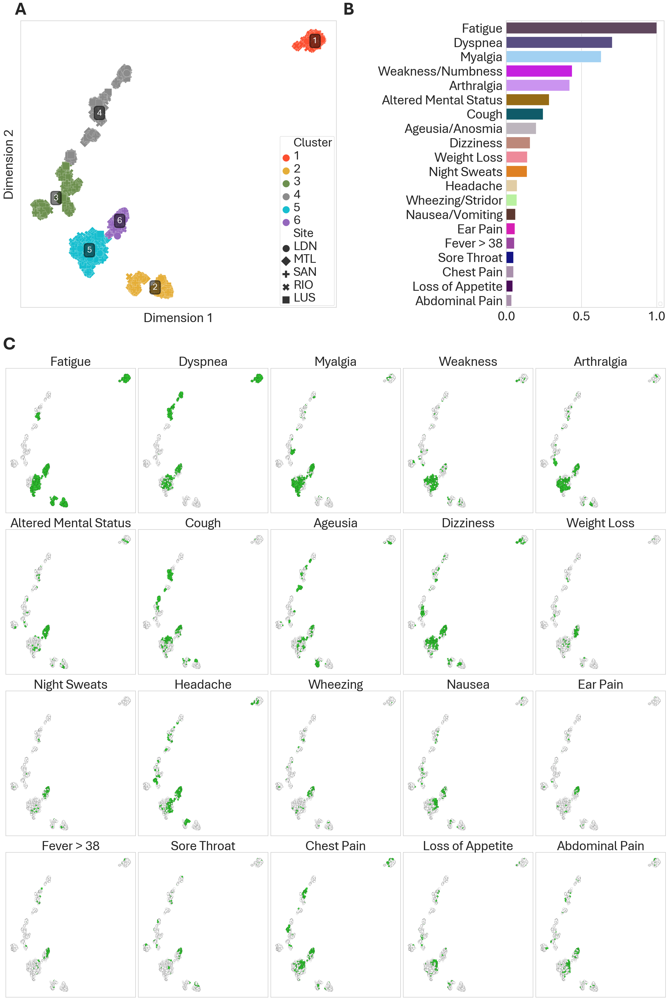

In [146]:
# plot

# make an array of axes for the second subfigure
# get the number of top_features
n = len(top_features)
n_rows = int(np.ceil(n/5))

# h_factor = 

fig     = plt.figure(layout="constrained", figsize=(24,36))
subfigs = fig.subfigures(2, 1, wspace=0.05, height_ratios=[1,2], hspace = 0.05)

axs0 = subfigs[0].subplots(1, 2, width_ratios=[2,1])
# subfigs[0].set_facecolor('lightblue')

plot_clusters(plot_df, 
              site_name_dict, 
              palette_dict, 
              title = None, 
              centroids = True, 
              size_by_prob = False, 
              ax = axs0[0],
              FONTSIZE = FONTSIZE*1.5,
              centroid_kws = {"alpha": 0.5, "palette_dict":None, "show_edge": False},)

# save just this plot
# plt.savefig(f"{figdir}/SYMPTOM-UMAP-HDBSCAN.png", dpi = 300, bbox_inches = 'tight')

# add annotation abve the plot
axs0[0].annotate("A",
                    xy=(0.0, 1.01), 
                    xycoords='axes fraction',
                    xytext=(0.0,0.0), 
                    textcoords = 'offset points',
                    fontsize = FONTSIZE*2,
                    horizontalalignment='center', 
                    verticalalignment='bottom',
                    fontweight = "bold",
                    )


plot_feature_importances(top_features, 
                         feature_map, 
                         feature_colour_map, 
                         axs0[1], 
                         FONTSIZE*1.5)
# @ save just this plot
plt.savefig(f"{figdir}/SYMPTOM-FI.png", dpi = 300, bbox_inches = 'tight')


axs0[1].annotate("B",
                    xy=(-1.0, 1.01), 
                    xycoords='axes fraction',
                    xytext=(0.0,0.0), 
                    textcoords = 'offset points',
                    fontsize = FONTSIZE*2,
                    horizontalalignment='center', 
                    verticalalignment='bottom',
                    fontweight = "bold",
                    )


# make an array of axes for the second subfigure
# get the number of top_features
n = len(top_features)

axs1 = subfigs[1].subplots(n_rows,5)

plot_multiple_features(fi_df, 
                        X,
                        plot_df, 
                        feature_map, 
                        site_name_dict,
                        site_style_dict,
                        highlight_colour = "limegreen",
                        ax = axs1,
                        subfig_label = " ",
                        show_centroids = False,
                        fontsize = FONTSIZE*1.5,

                        )

# subfigs[1].suptitle(" ")
subfigs[1].suptitle('C', fontsize=FONTSIZE*2, fontweight='bold', x = 0.0, y = 1.02, ha='left', va='top')
# plt.show()

SAVE = True

if SAVE:

    for dpi in [600, 300]:
        fn = f"{figdir}/SYMPTOM-FI-{n_clust}c-{dpi}dpi-{timestamp}.png"
        print(fn)
        plt.savefig(fn, dpi = dpi, bbox_inches = 'tight')

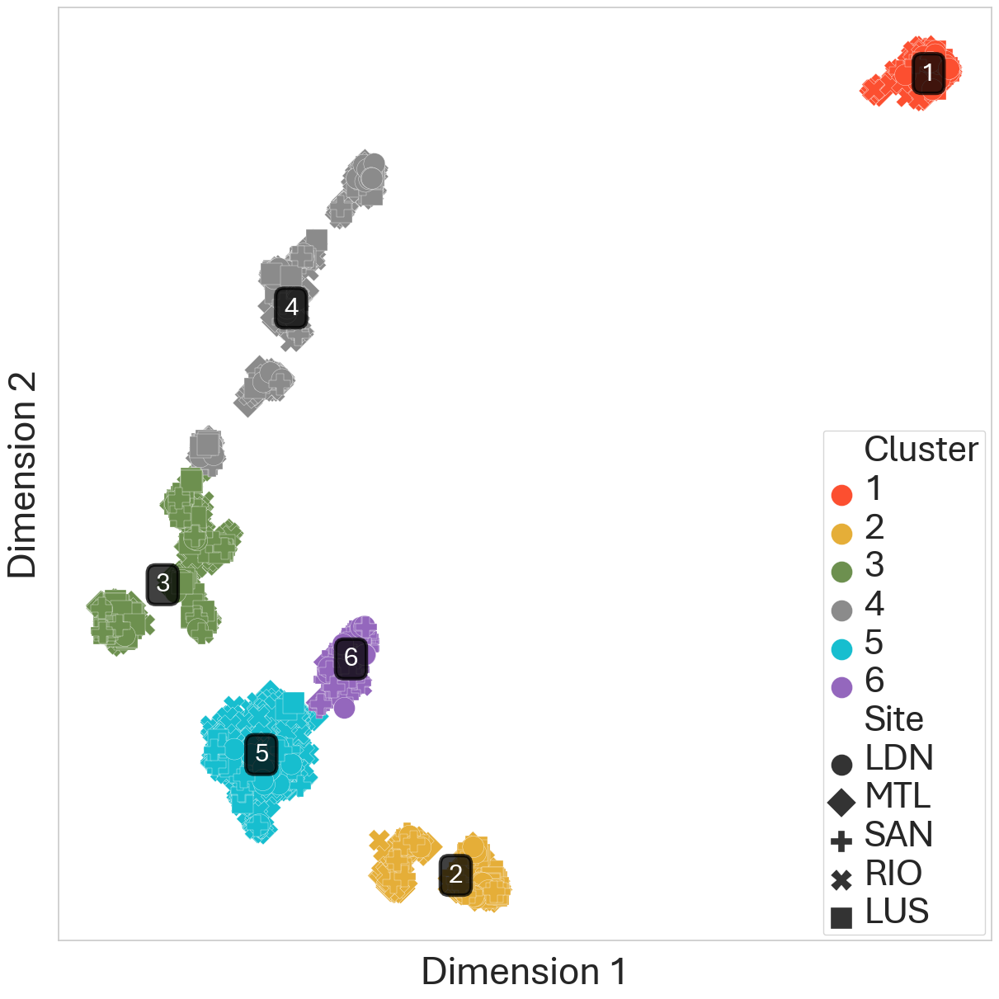

In [147]:
fig, ax = plt.subplots(1, 1, figsize=(12,12), layout="constrained")

plot_clusters(plot_df, 
              site_name_dict, 
              palette_dict, 
              title = None, 
              centroids = True, 
              size_by_prob = False, 
              ax = ax,
              FONTSIZE = FONTSIZE*1.5,
              centroid_kws = {"alpha": 0.75, "palette_dict":None, "show_edge": True},)

# put legend inside frame
# plt.legend(title = "Site",  frameon = True, facecolor = "white", edgecolor = "black", shadow = False, fontsize = FONTSIZE, title_fontsize = FONTSIZE)

# # save just this plot
# plt.savefig(f"{figdir}/SYMPTOM-UMAP-HDBSCAN-{timestamp}.png", dpi = 600, bbox_inches = 'tight')
# plt.savefig(f"{figdir}/SYMPTOM-UMAP-HDBSCAN-{timestamp}.pdf", dpi = 600, bbox_inches = 'tight')
plt.savefig(f"{figdir}/SYMPTOM-UMAP-HDBSCAN-{timestamp}.pdf", bbox_inches = 'tight')


In [148]:
fig, ax = plt.subplots(1, 1, figsize=(12,12), layout = "constrained", dpi=600)

plot_feature_importances(top_features, 
                         feature_map, 
                         feature_colour_map, 
                         ax,
                         FONTSIZE*1.25)
ax.set_ylabel("Feature", fontsize = 44)
# @ save just this plot
plt.savefig(f"{figdir}/SYMPTOM-FI-{timestamp}.png", dpi = 600, bbox_inches = 'tight')
plt.savefig(f"{figdir}/SYMPTOM-FI-{timestamp}.pdf", dpi = 600, bbox_inches = 'tight')



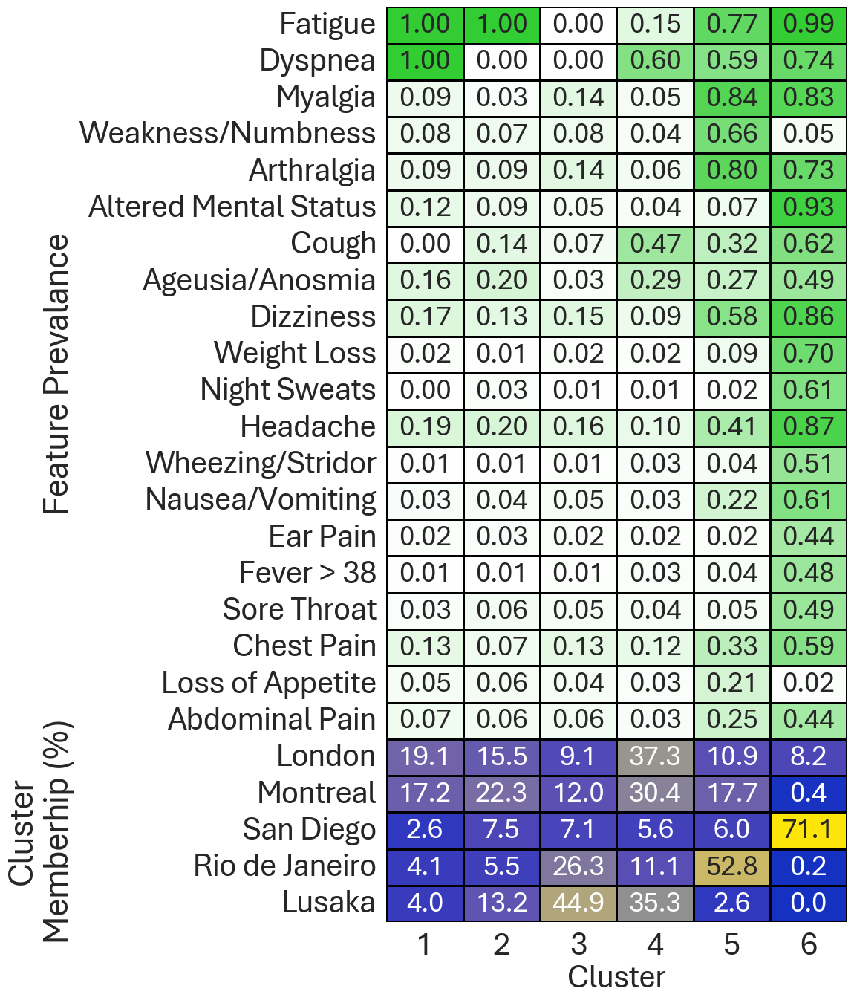

In [149]:
# heatmap of features by cluster
M = X.copy()
M = M[important_features]
M["cluster"] = [c+1 for c in cluster_labels]

FONTSIZE = 28

# get the means
mfv = M.groupby("cluster").mean()

# sort the index by the order in fi_df
mfv = mfv[fi_df["Feature"]]

# transpose
mfv = mfv.T

# rename mfv index
mfv.index = mfv.index.map(feature_map)


fig, (axs0, axs1) = plt.subplots(2, 1, figsize=(8,16),  sharex = True, height_ratios=[8,2])
fig.subplots_adjust(hspace = 0.0)

# logscale the heatmap colour
# cmap = sns.color_palette("viridis", as_cmap = True)

# from matplotlib.colors import LogNorm

sns.heatmap(mfv[:20], 
            cmap = cmap, 
            # norm = LogNorm(),
            ax = axs0, 
            cbar = False, 
            vmin = 0, 
            linewidth = 1, 
            # linewidth = 0.5, 
            square = False, 
            linecolor = 'k',
              annot = True,
                fmt = ".2f",
                annot_kws = {"fontsize": 28}
)

# turn off the xticks and x label
axs0.set_xticks([]); axs0.set_xlabel("")

sns.heatmap(cluster_membership_by_site,
            # cmap = 'viridis', 
            cmap = cc.cm.bjy, 
            # norm = LogNorm(),
            ax = axs1, 
            cbar = False, 
            vmin = 0, 
            linewidth = 1, 
            # linewidth = 0.5, 
            square = False, 
            linecolor = 'k',
              annot = True,
                fmt = ".1f",
                annot_kws = {"fontsize": 28}
)
axs0.set_ylabel("Feature Prevalance", fontsize = FONTSIZE*1.25)
axs1.set_ylabel("Cluster\nMemberhip (%)", fontsize = FONTSIZE*1.25)
# rotate axs1 yticks 90 degrees
axs1.set_yticklabels(axs1.get_yticklabels(), rotation = 00)

# make x axis label alrger
axs1.set_xlabel("Cluster", fontsize = 32)
#make tick labels larger
axs1.tick_params(axis='both', which='major', labelsize=32)
axs0.tick_params(axis='both', which='major', labelsize=32)

# fig.align_xlabels()

# align the ylabels
fig.align_ylabels()

# output the figure

# for dpi in [600, 300]:
#     fn = f"{figdir}/SYMPTOM-FPrev-{n_clust}c-{dpi}dpi-{timestamp}.png"
#     print(fn)
#     plt.savefig(fn, dpi = dpi, bbox_inches = 'tight')
fn = f"{figdir}/SYMPTOM-FPrev-{n_clust}c-{timestamp}.pdf"
plt.savefig(fn, dpi = dpi, bbox_inches = 'tight')

# picle mfv
mfv.to_pickle(f"./SYMPTOM-only-feature-prevalence-by-cluster.pkl")


In [150]:
# for each cluster in mfv, find the features that are > 0.3

# make a dataframe to hold the results

# make a dictionary to hold the results
rd = {}

# iterate over the columns in mfv

for c in mfv.columns:
    
        # sort the values in the column
        srt = mfv[c].copy()
        srt.sort_values(ascending = False, inplace = True)

        # print(srt)

        srt_grt = srt[srt > 0.3]


        if len(srt_grt) == 0:
            # get the top 3 features instead
            srt_grt = srt.nlargest(3)


        print(srt_grt.values)

        # get the feature names
        features = srt_grt.index
        values = srt_grt.values
    
        # strip the "LC+" from the feature names
        features = [f.replace("LC+ ", "") for f in features]

        if len(features) > 3:
                features = features[:3]
                values = values[:3]

                # set the last feature to "Other (diffuse)"
                features[-1] = "Others (diffuse)"

                # get the mean value of the other features

                vm = srt_grt.values[3:].mean()
                print(vm)


                # vm = 1

                values[-1] = vm

        # add to the dictionary
        rd.update({c: (features, values)})

# make a dataframe from the dictionary
rd_df2 = pd.DataFrame.from_dict(rd, orient = "index")



[1.         0.99545455]
[1.]
[0.16083916 0.15151515 0.14452214]
[0.60483871 0.46975806]
[0.83612663 0.79515829 0.77281192 0.66108007 0.58659218 0.57914339
 0.40968343 0.33333333 0.31843575]
0.4813780260707636
[0.99014778 0.92610837 0.87192118 0.86206897 0.82758621 0.73891626
 0.73399015 0.7044335  0.62068966 0.60591133 0.60591133 0.591133
 0.51231527 0.49261084 0.48768473 0.48275862 0.44334975 0.43842365
 0.43349754 0.40394089]
0.5873659808751086


In [151]:
rd_df2.reset_index(inplace = True)
# rename the columns
rd_df2.columns = ["Cluster", "Feature", "Value"]
rd_df2

,Cluster,Feature,Value
0,1,"[Dyspnea, Fatigue]","[1.0, 0.9954545454545455]"
1,2,[Fatigue],[1.0]
2,3,"[Headache, Dizziness, Arthralgia]","[0.16083916083916083, 0.15151515151515152, 0.1..."
3,4,"[Dyspnea, Cough]","[0.6048387096774194, 0.46975806451612906]"
4,5,"[Myalgia, Arthralgia, Others (diffuse)]","[0.8361266294227188, 0.7951582867783985, 0.481..."
5,6,"[Fatigue, Altered Mental Status, Others (diffu...","[0.9901477832512315, 0.9261083743842364, 0.587..."


In [152]:
# save rd_df2 to pickle
rd_df2.to_pickle(f"./SYMPTOM-only-rd_df2.pkl")

# TREEMAPS

In [153]:
# for each cluster in mfv, find the features that are > 0.3

rd = {}

# iterate over the columns in mfv

for c in mfv.columns:
    
        # sort the values in the column
        srt = mfv[c].copy()
        srt.sort_values(ascending = False, inplace = True)

        # find the features that are > 0.3
        srt_grt = srt[srt > 0.3]

        # print(srt_grt)

        # if they are all < 0.3, get the top 3
        if len(srt_grt) == 0:
            # get the top 3 features instead
            srt_grt = srt.nlargest(3)

        # get the feature names
        features = srt_grt.index
    
        # strip the "LC+" from the feature names
        features = [f.replace("LC+ ", "") for f in features]

        # if there are more than 3 features, keep only the top 3
        if len(features) > 3:
                features = features[:3]

                # set the last feature to "Other (diffuse)"
                features[-1] = "Others (diffuse)"

        # add to the dictionary
        rd.update({c: features})

# make a dataframe from the dictionary
rd_df = pd.DataFrame.from_dict(rd, orient = "index")



In [154]:
# summarize cbs by total number of records per cluster
cbs2 = cbs.sum(axis = 0)/cbs.sum().sum()*100

cbs2 = pd.DataFrame(cbs2, columns = ["Fraction"])

# reset the index
cbs2.reset_index(inplace = True)


In [155]:
s1 = rd_df[0].to_list()
s2 = rd_df[1].to_list()
s3 = rd_df[2].to_list()

cbs2["s1"] = pd.Series(s1)
cbs2["s2"] = pd.Series(s2)
cbs2["s3"] = pd.Series(s3)

In [156]:
# add a column to cbs2 that counts the number of symptoms
cbs2["n"] = cbs2["s1"].apply(lambda x: 1 if x != None else 0) + cbs2["s2"].apply(lambda x: 1 if x != None else 0) + cbs2["s3"].apply(lambda x: 1 if x != None else 0)

# round fraction to 1 decimal place
cbs2["Fraction"] = cbs2["Fraction"].round(1)

In [157]:
cbs2["colour"] = [cc.glasbey_dark[i] for i in cbs2["n"]]

# change the value of colour if s3 contains diffuse
idx = cbs2.loc[cbs2["s3"] == "Others (diffuse)"] 

cbs2.loc[idx.index, "colour"] = "#dedbef"


for i, row in cbs2.iterrows():

    # label elements
    l1 = row["s1"]
    if row["s2"] == None:
        l2 = ""
    else:
        l2 = row["s2"]

    if row["s3"] == None:
        l3 = ""
    else:   
        l3 = row["s3"]

    lbl = f"Cluster {i+1}:\n{row['Fraction']:0.1f}%\n{l1}"
    if l2 != "":
        lbl += f"\n{l2}"
    if l3 != "":
        lbl += f"\n{l3}"

    cbs2.loc[i, "label"] = lbl



In [158]:
# get the set of unique feature names in rd_df2["Features"]
features = set()

for i, row in rd_df2.iterrows():
    for f in row["Feature"]:
        features.add(f)

# make a dictionary to hold the results

features

{'Altered Mental Status',
 'Arthralgia',
 'Cough',
 'Dizziness',
 'Dyspnea',
 'Fatigue',
 'Headache',
 'Myalgia',
 'Others (diffuse)'}

In [159]:
data = []

rd_df2["Fraction"] = cbs2["Fraction"]

for i, row in rd_df2.iterrows():

    # print (i,row)

    cluster = row["Cluster"]
    features = row["Feature"]
    values = row["Value"]

    print(cluster, features, values)

    the_dict = {"id": f"Cluster {cluster}",
                "datum": row["Fraction"],
                }

    the_children = []

    for id,datum in zip(features, values):
            
            the_children.append({"id": id,
                                 "datum": datum,
                                })

    the_dict["children"] = the_children
    data.append(the_dict)
data

1 ['Dyspnea', 'Fatigue'] [1.         0.99545455]
2 ['Fatigue'] [1.]
3 ['Headache', 'Dizziness', 'Arthralgia'] [0.16083916 0.15151515 0.14452214]
4 ['Dyspnea', 'Cough'] [0.60483871 0.46975806]
5 ['Myalgia', 'Arthralgia', 'Others (diffuse)'] [0.83612663 0.79515829 0.48137803]
6 ['Fatigue', 'Altered Mental Status', 'Others (diffuse)'] [0.99014778 0.92610837 0.58736598]


[{'id': 'Cluster 1',
  'datum': 10.0,
  'children': [{'id': 'Dyspnea', 'datum': 1.0},
   {'id': 'Fatigue', 'datum': 0.9954545454545455}]},
 {'id': 'Cluster 2',
  'datum': 14.1,
  'children': [{'id': 'Fatigue', 'datum': 1.0}]},
 {'id': 'Cluster 3',
  'datum': 19.6,
  'children': [{'id': 'Headache', 'datum': 0.16083916083916083},
   {'id': 'Dizziness', 'datum': 0.15151515151515152},
   {'id': 'Arthralgia', 'datum': 0.1445221445221445}]},
 {'id': 'Cluster 4',
  'datum': 22.6,
  'children': [{'id': 'Dyspnea', 'datum': 0.6048387096774194},
   {'id': 'Cough', 'datum': 0.46975806451612906}]},
 {'id': 'Cluster 5',
  'datum': 24.5,
  'children': [{'id': 'Myalgia', 'datum': 0.8361266294227188},
   {'id': 'Arthralgia', 'datum': 0.7951582867783985},
   {'id': 'Others (diffuse)', 'datum': 0.4813780260707636}]},
 {'id': 'Cluster 6',
  'datum': 9.3,
  'children': [{'id': 'Fatigue', 'datum': 0.9901477832512315},
   {'id': 'Altered Mental Status', 'datum': 0.9261083743842364},
   {'id': 'Others (diffus

In [160]:
fc2 = {'Dyspnea': [0.32549, 0.270588, 0.545098],
       'Arthralgia': [0.807843, 0.521569, 1.0],
       'Cough': [0.0, 0.4, 0.470588],
       'Fatigue': [0.392157, 0.266667, 0.380392],
       'Dizziness': [0.784314, 0.509804, 0.435294],
       'Headache': [0.921569, 0.815686, 0.607843],
       'Myalgia': [0.584314, 0.827451, 1.0],
       'Altered Mental Status': [0.670588, 0.447059, 0.0],
       'Others (diffuse)': [0.8, 0.8, 0.8],}

In [161]:
# # select only keys that start with LC+
# feature_colour_map = {k: v for k, v in feature_colour_map.items() if k.startswith("LC+")}

# feature_colour_map = fc2

In [162]:

import circlify
circles = circlify.circlify(data, show_enclosure=False)


In [163]:

# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(16, 16), layout="constrained", dpi = 600)

# Remove axes
ax.axis('off')

# Find axis boundaries
lim = max(
    max(
        abs(circle.x) + circle.r,
        abs(circle.y) + circle.r,
    )
    for circle in circles
)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

COLOUR_FEATURES = False

if COLOUR_FEATURES:
    node_alpha  = 0.75
    child_alpha = 1.0
else:
    node_alpha   = 1.0
    child_alpha  = 0.5
    child_colour = "white"

# print circles
for i, circle in enumerate(circles):

    x, y, r = circle
    
    print(circle.ex["id"])
    
    if circle.level == 0:
        pass
    if circle.level == 1:
        idx = circle.ex["id"].split(" ")[1]
        the_color = cc.glasbey_hv[int(idx)]
        the_alpha = node_alpha
        font_size = 24
        font_weight = "bold"

        bbox_dict = dict(
                    facecolor=the_color,
                    edgecolor='black', 
                    boxstyle='round', 
                    pad=0.3,
                    linewidth = 1.5)

    if circle.level == 2:

        if COLOUR_FEATURES:
            if circle.ex["id"] in fc2.keys():
                print(f"FOUND {circle.ex['id']} in fc2.keys()")
                # child_color = fc2[circle.ex["id"]]
                the_color = fc2[circle.ex["id"]]
            else:
                the_color = "grey"
        else:
            the_color = child_colour

        the_alpha = child_alpha
        font_size = 32
        font_weight = "normal"

        bbox_dict = dict(
                        facecolor="white", 
                        edgecolor='black', 
                        boxstyle='round', 
                        pad=.2, 
                        alpha = 1.0, 
                        linewidth = 0.5, 
                        )

    # draw the circle
    ax.add_patch(plt.Circle(
                            (x, y), 
                            r, 
                            facecolor = the_color, 
                            alpha     = the_alpha,
                            fill      = True, 
                            ec        = "black",
                            lw        = 2.5,
                            )
                        )

    # add the labels
    if circle.level == 1:

        lbl1 = f"{circle.ex['id']} ({circle.ex['datum']}%)"

        ax.text(x, y+(r*1.0),
                lbl1, 
                ha='center', 
                va='bottom', 
                fontsize=48,
                color = "white", 
                fontweight = font_weight,
                bbox=bbox_dict)    

    # child circles
    if circle.level == 2:

        lbl = circle.ex["id"]
        wt  = circle.ex["datum"]

        # if there is a /, split and bnewling
        if "/" in lbl:
            lbl = lbl.split("/")[0] + "/\n" + lbl.split("/")[1]

        # split on spaces and replace with newlines
        lbl = lbl.replace(" ", "\n")
        ax.text(x, y, lbl,
                    ha='center', 
                    va='center', 
                    bbox     = bbox_dict,
                    fontsize = 32,
        )


# for dpi in [300,600]:

#     if COLOUR_FEATURES:
#         tag = "coloured-by-feature"
#     else:
#         tag = "coloured-by-cluster"
tag = "coloured-by-cluster"

#     fn = f"{figdir}/SYMPTOM-TREEMAP-{tag}-{n_clust}c-{dpi}dpi-{timestamp}.png"
#     print(fn)

#     plt.savefig(fn, dpi = dpi, bbox_inches = 'tight')

fn = f"{figdir}/SYMPTOM-TREEMAP-{tag}-{n_clust}c-{timestamp}.pdf"
plt.savefig(fn, bbox_inches = 'tight')

plt.show()

Cluster 6
Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5
Others (diffuse)
Altered Mental Status
Fatigue
Fatigue
Dyspnea
Others (diffuse)
Arthralgia
Dizziness
Headache
Cough
Arthralgia
Myalgia
Dyspnea
Fatigue


In [164]:
# save cbs2 as a pickle
cbs2.to_pickle(f"./SYMPTOM-only-TREEMAP-{n_clust}.pkl")

## Make a large image that incorporates all of the above figures

In [165]:
feature_colour_map

{'CoV Vasopressor/Inotrope': [0.188235, 0.635294, 0.854902],
 'Concentration Unknown Origin': [0.988235, 0.309804, 0.188235],
 '(Cov) Hospitalized': [0.898039, 0.682353, 0.219608],
 'CoV Steroids': [0.427451, 0.564706, 0.309804],
 'CoV Anticoagulant': [0.545098, 0.545098, 0.545098],
 'CoV Colchicine': [0.090196, 0.745098, 0.811765],
 'CoV Antibiotics': [0.580392, 0.403922, 0.741176],
 'Memory Unknown Origin': [0.839216, 0.152941, 0.156863],
 'CoV Oxygen': [0.121569, 0.466667, 0.705882],
 'Respiratory Unknown Origin': [0.890196, 0.466667, 0.760784],
 'CoV UnInfected': [0.54902, 0.337255, 0.294118],
 'CoV Mild': [0.737255, 0.741176, 0.133333],
 'CoV Moderate': [0.227451, 0.003922, 0.513725],
 'CoV Severe': [0.0, 0.262745, 0.0],
 'CoV SpO2': [0.058824, 1.0, 0.662745],
 'CoV ICU': [0.368627, 0.0, 0.25098],
 'CoV Non-ICU': [0.776471, 0.741176, 1.0],
 'PMHx Hypertension': [0.258824, 0.313725, 0.321569],
 'PMHx Asthma': [0.721569, 0.0, 0.501961],
 'PMHx Diabetes': [1.0, 0.717647, 0.701961],
 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Cluster 6
Cluster 1
Cluster 2
Cluster 3
Cluster 4
Cluster 5
Others (diffuse)
Altered Mental Status
Fatigue
Fatigue
Dyspnea
Others (diffuse)
Arthralgia
Dizziness
Headache
Cough
Arthralgia
Myalgia
Dyspnea
Fatigue


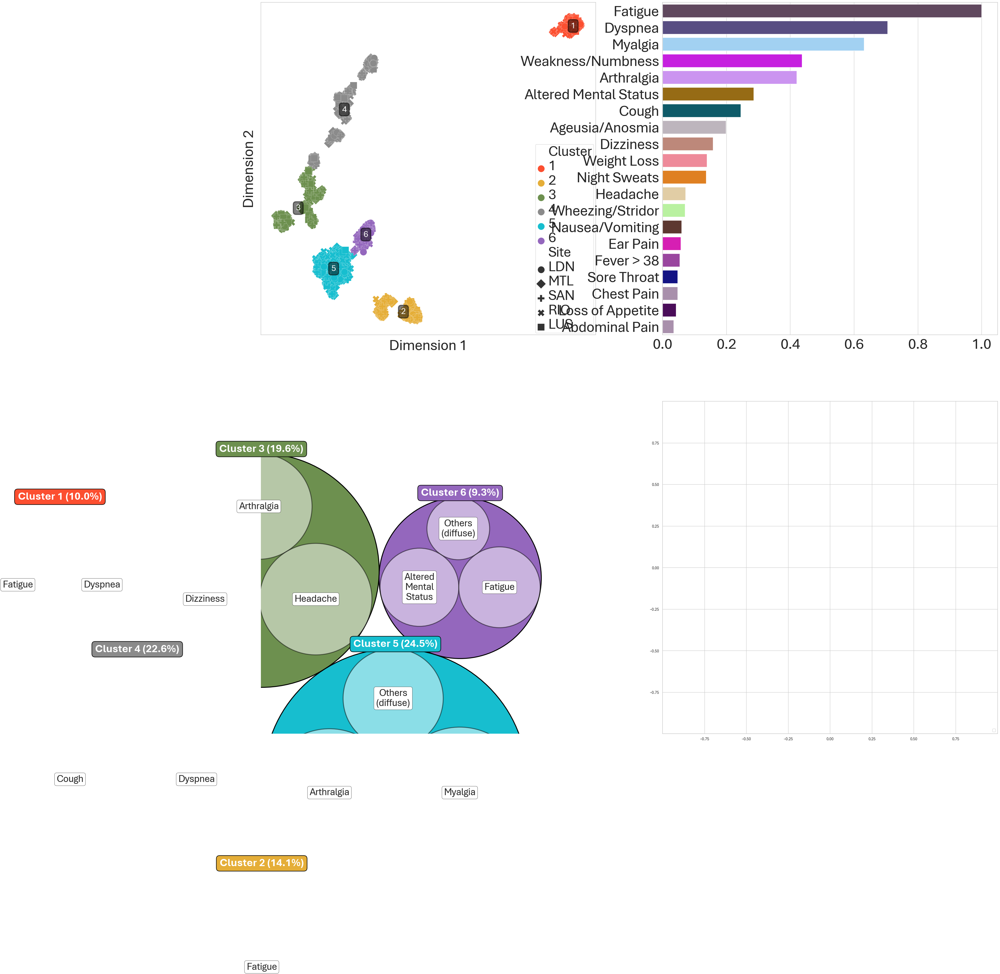

In [166]:
# use gridspec
fig = plt.figure(figsize=(36, 36), 
                #  layout = "constrained",
                 dpi = 100,)

gs = fig.add_gridspec(2, 2, width_ratios=[1,1], height_ratios=[1,1], )

ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1])

#==============================================================================
# clusters
#==============================================================================

plot_clusters(plot_df, 
              site_name_dict, 
              palette_dict, 
              title = None, 
              centroids = True, 
              size_by_prob = False, 
              ax = ax0,
              FONTSIZE = FONTSIZE*1.5,
              centroid_kws = {"alpha": 0.5, "palette_dict":None, "show_edge": False},)

#==============================================================================
# features
#==============================================================================
plot_feature_importances(top_features, 
                         feature_map, 
                         feature_colour_map, 
                         ax1,
                         FONTSIZE*1.5)

#==============================================================================
# treemap - ax2
#==============================================================================

# Remove axes
ax2.axis('off')

# Find axis boundaries
lim = max(
    max(
        abs(circle.x) + circle.r,
        abs(circle.y) + circle.r,
    )
    for circle in circles
)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

COLOUR_FEATURES = False

if COLOUR_FEATURES:
    node_alpha  = 0.75
    child_alpha = 1.0
else:
    node_alpha   = 1.0
    child_alpha  = 0.5
    child_colour = "white"

# print circles
for i, circle in enumerate(circles):

    x, y, r = circle
    
    print(circle.ex["id"])
    
    if circle.level == 0:
        pass
    if circle.level == 1:
        idx = circle.ex["id"].split(" ")[1]
        the_color = cc.glasbey_hv[int(idx)]
        the_alpha = node_alpha
        font_size = 24
        font_weight = "bold"

        bbox_dict = dict(
                    facecolor=the_color,
                    edgecolor='black', 
                    boxstyle='round', 
                    pad=0.3,
                    linewidth = 1.5)

    if circle.level == 2:

        if COLOUR_FEATURES:
            if circle.ex["id"] in fc2.keys():
                print(f"FOUND {circle.ex['id']} in fc2.keys()")
                # child_color = fc2[circle.ex["id"]]
                the_color = fc2[circle.ex["id"]]
            else:
                the_color = "grey"
        else:
            the_color = child_colour

        the_alpha = child_alpha
        font_size = 24
        font_weight = "normal"

        bbox_dict = dict(
                        facecolor="white", 
                        edgecolor='black', 
                        boxstyle='round', 
                        pad=.2, 
                        alpha = 1.0, 
                        linewidth = 0.5, 
                        )

    # draw the circle
    ax2.add_patch(plt.Circle(
                            (x, y), 
                            r, 
                            facecolor = the_color, 
                            alpha     = the_alpha,
                            fill      = True, 
                            ec        = "black",
                            lw        = 2.5,
                            )
                        )

    # add the labels
    if circle.level == 1:

        lbl1 = f"{circle.ex['id']} ({circle.ex['datum']}%)"

        ax2.text(x, y+(r*1.0),
                lbl1, 
                ha='center', 
                va='bottom', 
                fontsize=30,
                color = "white", 
                fontweight = font_weight,
                bbox=bbox_dict)    

    # child circles
    if circle.level == 2:

        lbl = circle.ex["id"]
        wt  = circle.ex["datum"]

        # if there is a /, split and bnewling
        if "/" in lbl:
            lbl = lbl.split("/")[0] + "/\n" + lbl.split("/")[1]

        # split on spaces and replace with newlines
        lbl = lbl.replace(" ", "\n")
        ax2.text(x, y, lbl,
                    ha='center', 
                    va='center', 
                    bbox     = bbox_dict,
                    fontsize = 28,
        )



#==============================================================================
# table
#==============================================================================
# sns.heatmap(mfv[:20], 
#             cmap = cmap, 
#             # norm = LogNorm(),
#             ax = ax3, 
#             cbar = False, 
#             vmin = 0, 
#             linewidth = 1, 
#             # linewidth = 0.5, 
#             square = False, 
#             linecolor = 'k',
#               annot = True,
#                 fmt = ".2f",
#                 annot_kws = {"fontsize": 24}
# )



# use the existing axs0 object here





### igraph

In [167]:
import pandas as pd
n_clust = 6


# load the pickle
cbs2 = pd.read_pickle(f"./SYMPTOM-only-TREEMAP-{n_clust}.pkl")
rd_df2 = pd.read_pickle("./SYMPTOM-only-rd_df2.pkl")

In [168]:
# import python igraph
import igraph as ig


In [169]:
# Make a list of tuples that joins the cluster number with the symptom
ee = []
wts = []

for i, row in rd_df2.iterrows():

    cluster = row["Cluster"]
    features = row["Feature"]
    values = row["Value"]

    print(cluster, features, values)

    for f,v in zip(features, values):
        ee.append((f, f"Cluster {cluster}"))
        wts.append(v)

ee, wts

1 ['Dyspnea', 'Fatigue'] [1.         0.99545455]
2 ['Fatigue'] [1.]
3 ['Headache', 'Dizziness', 'Arthralgia'] [0.16083916 0.15151515 0.14452214]
4 ['Dyspnea', 'Cough'] [0.60483871 0.46975806]
5 ['Myalgia', 'Arthralgia', 'Others (diffuse)'] [0.83612663 0.79515829 0.48137803]
6 ['Fatigue', 'Altered Mental Status', 'Others (diffuse)'] [0.99014778 0.92610837 0.58736598]


([('Dyspnea', 'Cluster 1'),
  ('Fatigue', 'Cluster 1'),
  ('Fatigue', 'Cluster 2'),
  ('Headache', 'Cluster 3'),
  ('Dizziness', 'Cluster 3'),
  ('Arthralgia', 'Cluster 3'),
  ('Dyspnea', 'Cluster 4'),
  ('Cough', 'Cluster 4'),
  ('Myalgia', 'Cluster 5'),
  ('Arthralgia', 'Cluster 5'),
  ('Others (diffuse)', 'Cluster 5'),
  ('Fatigue', 'Cluster 6'),
  ('Altered Mental Status', 'Cluster 6'),
  ('Others (diffuse)', 'Cluster 6')],
 [1.0,
  0.9954545454545455,
  1.0,
  0.16083916083916083,
  0.15151515151515152,
  0.1445221445221445,
  0.6048387096774194,
  0.46975806451612906,
  0.8361266294227188,
  0.7951582867783985,
  0.4813780260707636,
  0.9901477832512315,
  0.9261083743842364,
  0.5873659808751086])

In [170]:
g = ig.Graph( directed = True)

src = list(set([e[0] for e in ee]))
tgt = list(set([e[1] for e in ee]))

g.add_vertices(src)
g.add_vertices(tgt)

g.add_edges(ee)

ig.summary(g)

IGRAPH DN-- 15 14 -- 
+ attr: name (v)


In [171]:

# assign name attribute
g.vs["name"] = src + tgt
g.vs["color"] = ["white" if v in src else "grey" for v in g.vs["name"]]

g.vs["size"] = [100 if v in src else 20 for v in g.vs["name"]]

# enumerate the src vertices
src_idx = [g.vs.find(name = s).index for s in src]
tgt_idx = [g.vs.find(name = t).index for t in tgt]
# g.vs[tgt_idx]["name"] = [i+i for i in range(len(tgt))]
# change the colours of the source vertices using the index list

import colorcet as cc
from math import log10

# g.vs[tgt_idx]["color"] = [cc.glasbey_hv[i+1] for i in range(len(tgt))]

clr = []
for i, t in enumerate(tgt):
    the_tgt_idx = t.split(" ")[1]
    clr.append(cc.glasbey_hv[int(the_tgt_idx)])
g.vs[tgt_idx]["color"] = clr

g.vs[tgt_idx]["size"] = [log10(cbs2.loc[i, "Fraction"])*50 for i in range(len(tgt))]
# make a new empty layout object
layout = ig.Layout()

# for each vertex in the graph, assign a position
for i, v in enumerate(g.vs):

    if v["name"] in src:
       layout.append((0, i*120))


# for the target vertices, assign a position
# get the target vertices
tv = [v for v in g.vs if v["name"] not in src]

for i, v in enumerate(tv):
    layout.append((1, i*120))


# # tgt vertex label to the right
# g.vs[tgt_idx]["label_dist"] = 2
# g.vs[tgt_idx]["label_angle"] = 0

# # src vertex label to the left
# g.vs[src_idx]["label_dist"] = 2
# g.vs[src_idx]["label_angle"] = 3.14

# edge weights
g.es["width"] = [w*10 for w in wts]


# make the edge color equal to the target vertex color
g.es["color"] = [g.vs[e.target]["color"] for e in g.es]

In [172]:
# ig.plot(g,
#         bbox = (1200, 1200),
#         margin = 200,
#         # vertex_size = 40,
#         vertex_label = g.vs["name"],
#         # layout = layout,
#         layout = 'circular',
#         autocurve = True,

#         edge_width = g.es["width"],

#         # make arrowhead wider
#         edge_arrow_size = 2.5,


#         # offset the vertex label to the right

#         # vertex_label_dist = 1.5,
#         # vertex_label_angle = 0,

#         # curve edges
#         # edge_curved = 0.3,
# )

### for LaTeX

In [173]:
# make an output dir for tex files
from pathlib import Path
texpath = Path("./tex-figures")

if not texpath.exists():
    texpath.mkdir()


In [174]:
# load the sites symptoms pickle
mfv = pd.read_pickle(f"./sites-symptoms.pkl")

In [175]:
fc2 = {'Dyspnea': [0.32549, 0.270588, 0.545098],
       'Arthralgia': [0.807843, 0.521569, 1.0],
       'Cough': [0.0, 0.4, 0.470588],
       'Fatigue': [0.392157, 0.266667, 0.380392],
       'Dizziness': [0.784314, 0.509804, 0.435294],
       'Headache': [0.921569, 0.815686, 0.607843],
       'Myalgia': [0.584314, 0.827451, 1.0],
       'Altered Mental Status': [0.670588, 0.447059, 0.0],
       'Others (diffuse)': [0.8, 0.8, 0.8],}

In [176]:
# get the set of unique feature names in rd_df2["Features"]
features = set()

for i, row in rd_df2.iterrows():
    for f in row["Feature"]:
        features.add(f)

features

{'Altered Mental Status',
 'Arthralgia',
 'Cough',
 'Dizziness',
 'Dyspnea',
 'Fatigue',
 'Headache',
 'Myalgia',
 'Others (diffuse)'}

In [177]:
rd_df2["Fraction"] = cbs2["Fraction"]

In [178]:
import matplotlib.colors as mcolors
import colorcet as cc

### Nodes

In [179]:
# NODES - Clusters
cluster_data = pd.DataFrame()

cluster_data["Cluster"] = rd_df2["Cluster"]

# fraction should be converted to the start and stop positions coveriung 180 degrees
cluster_data["start"] = 0
cluster_data["stop"] = 0

# iterate over the clusters

for i, row in rd_df2.iterrows():
    
        # get the cluster number
        cluster = row["Cluster"]

        # get the fraction
        frac = row["Fraction"]

        if i == 0:
            start = 0
            stop = frac
        else:
            start = stop
            stop = start + frac

        cluster_data.loc[i, "start"] = int(start*180/100)
        cluster_data.loc[i, "stop"] = int(stop*180/100)
        cluster_data.loc[i, "mid"] = ((start + stop)/2)*180/100
        # convert HTML colour to RGB
        c = mcolors.to_rgb(cbs2.loc[i, "colour"])
        c = [int(255*x) for x in c]
        cluster_data.loc[i, "COLOUR"] = f"clustercolour{cluster}"
        cluster_data.loc[i, "NW"] = round(frac*180/100)

# rename the columns
cluster_data.columns = ["LABEL", "START", "END", "MID", "COLOUR","NW"]

# resequence the columns
cluster_data = cluster_data[["START", "END", "MID", "NW","COLOUR", "LABEL"]]

# prepend text to the label
cluster_data["NODENAME"] = cluster_data["LABEL"].apply(lambda x: f"c{x}")
cluster_data["LABEL"] = cluster_data["LABEL"].apply(lambda x: f"Cluster {x}")

cluster_data

,START,END,MID,NW,COLOUR,LABEL,NODENAME
0,0,18,9.00,18.0,clustercolour1,Cluster 1,c1
1,18,43,30.69,25.0,clustercolour2,Cluster 2,c2
2,43,78,61.02,35.0,clustercolour3,Cluster 3,c3
3,78,119,99.00,41.0,clustercolour4,Cluster 4,c4
4,119,163,141.39,44.0,clustercolour5,Cluster 5,c5
5,163,180,171.81,17.0,clustercolour6,Cluster 6,c6


In [180]:
# NODES - Symptoms

features_data = pd.DataFrame()

# how many features?
n_features = len(features)

# sort the features
features = sorted(features)


features_data["LABEL"] = [f for f in features]
for i in range(n_features):
    start = 180/n_features*i + 180
    end  = 180/n_features*(i+1) + 180

    features_data.loc[i, "START"] = start
    features_data.loc[i, "END"] = end
    features_data.loc[i, "MID"] = (start + end)/2

    features_data.loc[i, "NW"] = 180/n_features

    # features_data.loc[i, "COLOUR"] = "gray"
    features_data.loc[i, "COLOUR"] = f"featurecolour{i+1}"

    features_data.loc[i,"NODENAME"] = f"f{i+1}"


    # add a coloumn for textcolour, based on the luminance of the COLOUR
    # get the RGB values
    c = mcolors.to_rgb(cc.glasbey_hv[i+1])

    # get the luminance
    lum = 0.2126*c[0] + 0.7152*c[1] + 0.0722*c[2]
    print(features_data.loc[i, "LABEL"],c,lum)


    # if the luminance is less than 0.5, use white, otherwise use black
    if lum > 0.4:
        features_data.loc[i, "TEXTCOLOUR"] = "white"
    else:
        features_data.loc[i, "TEXTCOLOUR"] = "black"

# TODO:
# get teh text colours right!

# resequence
features_data = features_data[["START", "END", "MID", "NW", "COLOUR","LABEL","NODENAME","TEXTCOLOUR"]]


Altered Mental Status (0.988235, 0.309804, 0.188235) 0.4452611488
Arthralgia (0.898039, 0.682353, 0.219608) 0.6947976546
Cough (0.427451, 0.564706, 0.309804) 0.5171216626
Dizziness (0.545098, 0.545098, 0.545098) 0.545098
Dyspnea (0.090196, 0.745098, 0.811765) 0.6106791921999999
Fatigue (0.580392, 0.403922, 0.741176) 0.4657892608
Headache (0.839216, 0.152941, 0.156863) 0.2991262334
Myalgia (0.121569, 0.466667, 0.705882) 0.4105704882
Others (diffuse) (0.890196, 0.466667, 0.760784) 0.5779445128


In [181]:
# save colours and nodes

# write colours as TEX file

# write out the SYMPTOM colours 
with open(texpath / "colours-features.tex", "w") as f:

    for i,row in features_data.iterrows():
        c = fc2[row["LABEL"]]
        f.write(f"\\definecolor{{featurecolour{i+1}}}{{RGB}}{{{c[0]*255}, {c[1]*255}, {c[2]*255}}}\n")

f.close()

# CLUSTER colours
with open(texpath / "colours-clusters.tex", "w") as f:

    for i,row in cluster_data.iterrows():
        c = cc.glasbey_hv[i+1]
        f.write(f"\\definecolor{{clustercolour{i+1}}}{{RGB}}{{{c[0]*255}, {c[1]*255}, {c[2]*255}}}\n")

f.close()


# save each set of nodes as csv
cluster_data.to_csv(texpath / "nodes-cluster.csv", index = False)
features_data.to_csv(texpath / "nodes-symptom.csv", index = False)

# stack with the tikz_data dataframe
tikz_data = pd.concat([cluster_data, features_data], axis = 0)
# tikz_data.to_csv(texpath / "nodes-cluster-x-symptoms.csv", index = False)

In [182]:
# NODES - Sites

site_nodes = pd.DataFrame()

for i in range(len(site_name_dict)):
    site_nodes.loc[i, "LABEL"] = list(site_name_dict.values())[i]
    # site_nodes.loc[i, "COLOUR"] = list(site_style_dict.values())[i]

    start = 180/len(site_name_dict)*i
    end = 180/len(site_name_dict)*(i+1)
    mid = (start + end)/2

    site_nodes.loc[i, "START"] = start
    site_nodes.loc[i, "END"] = end
    site_nodes.loc[i, "MID"] = mid
    site_nodes.loc[i, "MIDALT"] = mid+180
    site_nodes.loc[i, "STARTALT"] = start+180
    site_nodes.loc[i, "ENDALT"] = end+180

    site_nodes.loc[i, "NW"] = 180/len(site_name_dict)

    site_nodes.loc[i, "NODENAME"] = f"site{i+1}"
    site_nodes.loc[i, "SITE"] = f"{i+1}"



# resequence
site_nodes = site_nodes[["START", "END", "MID", "NW", "LABEL","NODENAME","SITE","MIDALT","STARTALT", "ENDALT"]]

site_nodes.to_csv(texpath / "nodes-sites.csv", index = False)
site_nodes


,START,END,MID,NW,LABEL,NODENAME,SITE,MIDALT,STARTALT,ENDALT
0,0.0,36.0,18.0,36.0,LDN,site1,1,198.0,180.0,216.0
1,36.0,72.0,54.0,36.0,MTL,site2,2,234.0,216.0,252.0
2,72.0,108.0,90.0,36.0,SAN,site3,3,270.0,252.0,288.0
3,108.0,144.0,126.0,36.0,RIO,site4,4,306.0,288.0,324.0
4,144.0,180.0,162.0,36.0,LUS,site5,5,342.0,324.0,360.0


In [183]:
# count the sites


s2 = sites.value_counts()/sites.value_counts().sum()*100

# add the s2 fractions to the site_nodes dataframe, matching on the site label
site_nodes["FRACTION"] = 0

for i, row in site_nodes.iterrows():

    site = row["LABEL"]
    print(site)
    frac = s2.loc[site]
    site_nodes.loc[i, "FRACTION"] = round(frac,1)
    site_nodes.loc[i, "NW2"] = site_nodes.loc[i, "FRACTION"]*180/100

    # start, stop, mid
    if i == 0:
        site_nodes.loc[i, "START2"] = 0
        site_nodes.loc[i, "END2"] = site_nodes.loc[i, "FRACTION"]*180/100
    else:
        site_nodes.loc[i, "START2"] = site_nodes.loc[i-1, "END2"]
        site_nodes.loc[i, "END2"] = site_nodes.loc[i, "START2"] + site_nodes.loc[i, "NW2"]


    site_nodes.loc[i, "MID2"] = (site_nodes.loc[i, "START2"] + site_nodes.loc[i, "END2"])/2

site_nodes.to_csv(texpath / "nodes-sites.csv", index = False)
site_nodes

LDN
MTL
SAN
RIO
LUS


,START,END,MID,NW,LABEL,NODENAME,SITE,MIDALT,STARTALT,ENDALT,FRACTION,NW2,START2,END2,MID2
0,0.0,36.0,18.0,36.0,LDN,site1,1,198.0,180.0,216.0,5.0,9.00,0.00,9.00,4.50
1,36.0,72.0,54.0,36.0,MTL,site2,2,234.0,216.0,252.0,40.8,73.44,9.00,82.44,45.72
2,72.0,108.0,90.0,36.0,SAN,site3,3,270.0,252.0,288.0,12.1,21.78,82.44,104.22,93.33
3,108.0,144.0,126.0,36.0,RIO,site4,4,306.0,288.0,324.0,29.7,53.46,104.22,157.68,130.95
4,144.0,180.0,162.0,36.0,LUS,site5,5,342.0,324.0,360.0,12.4,22.32,157.68,180.00,168.84


### Edges

In [184]:
# EDGES - CLUSTERS to SYMPTOMS

edges_df = pd.DataFrame()
edge_dict = {}

edges_list = []

# use the edges calculated above in igraph section
for edge, weight in zip(ee, wts):
    t = edge[0]
    s = edge[1]

    # print(edge)

    w = weight

    # look up the mid points
    mids = tikz_data.loc[tikz_data['LABEL'] == s]["MID"].values[0]
    midt = tikz_data.loc[tikz_data['LABEL'] == t]["MID"].values[0]

    # look up the node names for source and target
    ns = tikz_data.loc[tikz_data['LABEL'] == s]["NODENAME"].values[0]
    nt = tikz_data.loc[tikz_data['LABEL'] == t]["NODENAME"].values[0]
    
    # print(ns,nt)

    # look up the colour of the source node
    c = tikz_data.loc[tikz_data['LABEL'] == t]["COLOUR"].values[0]
    # print(c)

    # print(midt, mids, midt - mids, w)

    if midt - mids > 120:
        side = "right"
    else:
        side = "left"

    # # determine the direction of the bend
    # if mids > 270.00:
    #     side = "left"
    # else:
    #     side = "right"
    
    edge_string = f"({ns}) to [bend {side}=45] ({nt})"

    # print(edge_string)

    dd = (ns, nt, max(int(w*10),5), edge_string,c)

    edges_list.append(dd)

# make a dataframe from the list of tuples
edges_df = pd.DataFrame(edges_list, columns = ["NODESTART", "NODEEND","WIDTH","EDGESTRING","EDGECOLOUR"])

# select

# save edges_df as csv, without index
edges_df.to_csv(texpath / "edges-cluster-x-symptoms.csv", index = False)
print(edges_df)

# for ther ternary diagram, all edges should bend left
# take edges_df and change the bend direction to left
edges_df["EDGESTRING"] = edges_df["EDGESTRING"].apply(lambda x: x.replace("left", "right"))
edges_df["EDGESTRING"] = edges_df["EDGESTRING"].apply(lambda x: x.replace("25", "60"))

# output
edges_df.to_csv(texpath / "edges-cluster-x-symptoms-ternary.csv", index = False)

   NODESTART NODEEND  WIDTH                    EDGESTRING      EDGECOLOUR
0         c1      f5     10  (c1) to [bend right=45] (f5)  featurecolour5
1         c1      f6      9  (c1) to [bend right=45] (f6)  featurecolour6
2         c2      f6     10  (c2) to [bend right=45] (f6)  featurecolour6
3         c3      f7      5  (c3) to [bend right=45] (f7)  featurecolour7
4         c3      f4      5  (c3) to [bend right=45] (f4)  featurecolour4
5         c3      f2      5  (c3) to [bend right=45] (f2)  featurecolour2
6         c4      f5      6  (c4) to [bend right=45] (f5)  featurecolour5
7         c4      f3      5  (c4) to [bend right=45] (f3)  featurecolour3
8         c5      f8      8  (c5) to [bend right=45] (f8)  featurecolour8
9         c5      f2      7   (c5) to [bend left=45] (f2)  featurecolour2
10        c5      f9      5  (c5) to [bend right=45] (f9)  featurecolour9
11        c6      f6      9   (c6) to [bend left=45] (f6)  featurecolour6
12        c6      f1      9   (c6) to 

In [185]:
features_data

,START,END,MID,NW,COLOUR,LABEL,NODENAME,TEXTCOLOUR
0,180.0,200.0,190.0,20.0,featurecolour1,Altered Mental Status,f1,white
1,200.0,220.0,210.0,20.0,featurecolour2,Arthralgia,f2,white
2,220.0,240.0,230.0,20.0,featurecolour3,Cough,f3,white
3,240.0,260.0,250.0,20.0,featurecolour4,Dizziness,f4,white
4,260.0,280.0,270.0,20.0,featurecolour5,Dyspnea,f5,white
5,280.0,300.0,290.0,20.0,featurecolour6,Fatigue,f6,white
6,300.0,320.0,310.0,20.0,featurecolour7,Headache,f7,black
7,320.0,340.0,330.0,20.0,featurecolour8,Myalgia,f8,white
8,340.0,360.0,350.0,20.0,featurecolour9,Others (diffuse),f9,white


In [186]:
mfv

,Altered Mental Status,Arthralgia,Cough,Dyspnea,Dizziness,Fatigue,Headache,Myalgia
SITE,,,,,,,,
LDN,0.309091,0.209091,0.272727,0.618182,0.181818,0.600000,0.236364,0.154545
LUS,0.033088,0.058824,0.297794,0.231618,0.040441,0.202206,0.088235,0.069853
MTL,0.080447,0.210056,0.216760,0.464804,0.138547,0.606704,0.220112,0.201117
RIO,0.004608,0.499232,0.245776,0.422427,0.516129,0.491551,0.281106,0.508449
SAN,0.744361,0.620301,0.518797,0.616541,0.684211,0.875940,0.710526,0.691729


In [187]:
# EDGES - SITES to SYMPTOMS

# sort the cols
mfv = mfv[sorted(mfv.columns)]

# name mapping
site_map = {1:'LDN',
            2:'MTL',
            3:'SAN',
            4:'RIO',
            5:'LUS',}

# reverse the site_map
site_map = {v:k for k,v in site_map.items()}

# add a column for other (diffuse)

mfv["Others (diffuse)"] = 0.05

edges_list = []

idx = 1

for i, row in mfv.iterrows():

    idx = site_map[i]

    ns = f"site{idx}"
    for j, v in enumerate(mfv.columns):
        print(j+1,v)

        nt = f"f{j+1}"
        w = row[j]

        # TODO: calcualte side

        # look up the mid points
        mids = site_nodes.loc[site_nodes['SITE'] == str(idx)]["MID"].values[0]
        midt = features_data.loc[features_data['LABEL'] == v]["MID"].values[0]

        # print(midt, mids, midt - mids)

        # look up the colour of the target node
        c = features_data.loc[features_data['LABEL'] == v]["COLOUR"].values[0]


        if midt - mids > 120:
            side = "right"
        else:
            side = "left"

        # print(ns,nt)

        if w > 0.3:

            edge_string = f"({ns}) to [bend {side}=25] ({nt})"
            # edges_list.append(( ns, nt, 3,edge_string))
            edges_list.append(( ns, nt, int(w*10),edge_string,c))
        else:
            pass

        # for  lusak, the weights are quite low
        if idx == 5:
            if w > 0.13:
                edge_string = f"({ns}) to [bend {side}=25] ({nt})"
                # edges_list.append(( ns, nt, 3,edge_string))
                edges_list.append(( ns, nt, int(w*10),edge_string,c))
                print(ns, nt, w, edge_string)
            else:
                pass
        
        if v == "Others (diffuse)":
            edge_string = f"({ns}) to [bend {side}=25] ({nt})"
            # edges_list.append(( ns, nt, 3,edge_string))
            edges_list.append(( ns, nt, 1,edge_string,c))
            print(ns, nt, w, edge_string)


    idx += 1


# # make a dataframe from the list of tuples
edges_df = pd.DataFrame(edges_list, columns = ["NODESTART", "NODEEND","WIDTH", "EDGESTRING","EDGECOLOUR"])

# save df
edges_df.to_csv(texpath / "edges-sites-x-symptoms.csv", index = False)

print(edges_df)


# for ther ternary diagram, all edges should bend left
# take edges_df and change the bend direction to left
edges_df["EDGESTRING"] = edges_df["EDGESTRING"].apply(lambda x: x.replace("right", "left"))
edges_df["EDGESTRING"] = edges_df["EDGESTRING"].apply(lambda x: x.replace("25", "60"))

edges_df.to_csv(texpath / "edges-sites-x-symptoms-ternary.csv", index = False)

1 Altered Mental Status
2 Arthralgia
3 Cough
4 Dizziness
5 Dyspnea
6 Fatigue
7 Headache
8 Myalgia
9 Others (diffuse)
site1 f9 0.05 (site1) to [bend right=25] (f9)
1 Altered Mental Status
2 Arthralgia
3 Cough
site5 f3 0.2977941176470588 (site5) to [bend left=25] (f3)
4 Dizziness
5 Dyspnea
site5 f5 0.23161764705882354 (site5) to [bend left=25] (f5)
6 Fatigue
site5 f6 0.20220588235294118 (site5) to [bend right=25] (f6)
7 Headache
8 Myalgia
9 Others (diffuse)
site5 f9 0.05 (site5) to [bend right=25] (f9)
1 Altered Mental Status
2 Arthralgia
3 Cough
4 Dizziness
5 Dyspnea
6 Fatigue
7 Headache
8 Myalgia
9 Others (diffuse)
site2 f9 0.05 (site2) to [bend right=25] (f9)
1 Altered Mental Status
2 Arthralgia
3 Cough
4 Dizziness
5 Dyspnea
6 Fatigue
7 Headache
8 Myalgia
9 Others (diffuse)
site4 f9 0.05 (site4) to [bend right=25] (f9)
1 Altered Mental Status
2 Arthralgia
3 Cough
4 Dizziness
5 Dyspnea
6 Fatigue
7 Headache
8 Myalgia
9 Others (diffuse)
site3 f9 0.05 (site3) to [bend right=25] (f9)
   NO

In [188]:
# EDGES - CLUSTER to SITE

# load cbsm from pickle
cluster_membership_by_site = pd.read_pickle(f"./SYMPTOM-only-cluster-by-site-{n_clust}.pkl")



edges_list = []

idx = 1

for i, row in cluster_membership_by_site.iterrows():

    # idx = site_map[i]

    ns = f"site{idx}"

    # ns = f"site{idx}"
    for j, v in enumerate(cluster_membership_by_site.columns):

        nt = f"c{j+1}"
        w = cluster_membership_by_site[v][i]
        
    #     # look up the mid points
        mids = site_nodes.loc[site_nodes['SITE'] == str(idx)]["MID"].values[0]
        midt = cluster_data.loc[cluster_data['NODENAME'] == nt]["MID"].values[0]
        # midt = 0
        # TODO fix this

        # look up the colour of this cluster
        c = cluster_data.loc[cluster_data['NODENAME'] == nt]["COLOUR"].values[0]

        # print(ns, nt, midt, 360-mids, midt - (360-mids))

        if midt - (360-mids) < -120:
            side = "left"
        else:
            side = "right"

    #     print(ns,nt)

    #     if w > 0.3:

        if w > 0:
            edge_string = f"({ns}) to [bend {side}=25] ({nt})"
            edges_list.append(( ns, nt, w/1,edge_string,c))
        else:
            pass

    idx += 1


# # make a dataframe from the list of tuples
edges_df = pd.DataFrame(edges_list, columns = ["NODESTART", "NODEEND","WIDTH", "EDGESTRING","EDGECOLOUR"])

# save df
edges_df.to_csv(texpath / "edges-sites-x-clusters--2.csv", index = False)

# print(edges_df)


# for ther ternary diagram, all edges should bend left
# take edges_df and change the bend direction to left
edges_df["EDGESTRING"] = edges_df["EDGESTRING"].apply(lambda x: x.replace("left", "right"))
edges_df["EDGESTRING"] = edges_df["EDGESTRING"].apply(lambda x: x.replace("25", "60"))

edges_df.to_csv(texpath / "edges-sites-x-clusters-ternary.csv", index = False)